In [1]:
import pickle, glob

import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.colors as colors

from matplotlib import rc
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

from scipy.signal import savgol_filter
from scipy import fftpack
from scipy import stats
from scipy.stats import multivariate_normal, norm
from scipy.ndimage.filters import gaussian_filter1d

import statsmodels.api as sm

from statsmodels.nonparametric.kernel_regression import KernelReg

from ast import literal_eval
from mpl_toolkits.axisartist.axislines import AxesZero
from matplotlib.ticker import StrMethodFormatter, NullFormatter, ScalarFormatter
from shapely.geometry import Point
from matplotlib.transforms import ScaledTranslation

import matplotlib as mpl

plt.rcParams['legend.handlelength'] = 1
plt.rcParams['legend.handleheight'] = 1.125
plt.rcParams["font.family"]         = "Avenir"
#mpl.rcParams['pdf.fonttype'] = 42

path_to_images  = r'/Users/Guille/Desktop/caiso_power/images/'
path_to_aux     = r'/Users/Guille/Desktop/caiso_power/data/auxiliary/'
path_to_data    = r'/Users/Guille/Desktop/caiso_power/data/'
path_to_maps    = r'/Users/Guille/Desktop/caiso_power/data/maps/'
path_to_prc     = r'/Users/Guille/Desktop/caiso_power/data/processed/'


path_to_results = r'/Users/Guille/Desktop/caiso_power/results/journal_paper_w_sigma/'
path_to_results = r'/Users/Guille/Desktop/caiso_power/results/journal_paper_w_sigma_n_lambda/'
#path_to_mdls    = r'/Users/Guille/Desktop/caiso_power/models/journal_paper_w_sigma_n_lambda-Cal/'
path_to_mdls    = r'/Users/Guille/Desktop/caiso_power/models/journal_paper_w_sigma_n_lambda-Cal-2/'
#path_to_mdls    = r'/Users/Guille/Desktop/caiso_power/models/journal_paper_w_sigma_n_lambda-NoCal/'


# Get California unlities and remove the ones that are not CAISO
_world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
_US    = gpd.read_file(path_to_maps + r"US/tl_2022_us_state.shp")
_CAISO = gpd.read_file(path_to_maps + r"CAISO/Balancing_Authority_Areas_in_CA.shp")
_CAISO = _CAISO.iloc[[1, 7]].to_crs("EPSG:4326")
W_ref_ = pickle.load(open(path_to_aux + r'ref_grid_0.125_(-125,-112)_(32,43).pkl', 'rb'))

resources_  = ['load', 'solar', 'wind']
dl_methods_ = ['BLR', 'RVM', 'GPR']
sl_methods_ = ['lasso', 'OMP', 'elastic_net', 'group_lasso']

colors_1_ = ['#7d6674', '#006995', '#f48d64', '#09155a', '#e6cd94', '#0041a5']
colors_2_ = ['#126463', '#2CB7B5', '#CA8250']
colors_3_ = ['#1F390D', '#756A00', '#D8A581', '#92918B']

/var/folders/0c/ffx2kgyn7xq4krqrpsv67l3m0000gn/T/ipykernel_3814/3082306442.py:21: DeprecationWarning: Please use `gaussian_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter1d


In [2]:
# def _plot_confidence_intervals(ax, _model, meta_, _baselines, colors_, i_zone, i_resource, i_sample, 
#                                y_min     = 0.,
#                                y_max     = 0., 
#                                i_hour    = -1.,
#                                legend    = True, 
#                                path      = '',
#                                linestyle = '-',
#                                save      = True, 
#                                file_name = 'noname.pdf', 
#                                title    = ''):    
    
#     z_scores_  = [0.84, 1.28, 1.64, 1.96, 2.24]
#     ci_        = [60, 80, 90, 95, 97.5]
#     ci_colors_ = ['#99A3A4', '#B2BABB', '#CCD1D1', '#E0E0E0', '#E5E8E8']
        
#     y_  = _model['targets'][i_sample, i_resource, :]
#     mu_ = _model['mean'][i_sample, i_resource, :]
#     s2_ = np.sqrt(_model['variance'][i_sample, i_resource, :])
    
#     y_prs_ = _baselines['persitence'][i_sample, i_zone, :]
#     y_clm_ = _baselines['climatology'][i_sample, i_zone, :]
#     y_iso_ = _baselines['caiso'][i_sample, i_zone, :]
    
#     x_ = np.linspace(0, 23, 24, dtype = int)

#     ax.set_title(r'{}'.format(title), fontsize = 14)

#     ax.plot(x_, _force_zero(y_), color     = 'r', 
#                                  linestyle = linestyle, 
#                                  #label     = r'$y$ (ac)',
#                                  lw        = 2.5, 
#                                  alpha     = .75, 
#                                  zorder    = 13)


#     ax.plot(x_, _force_zero(mu_), color     = 'k', 
#                                   linestyle = '-', 
#                                   label     = r'$\mu$ (fc)',
#                                   lw        = 1., 
#                                   alpha     = 1., 
#                                   zorder    = 10)
    
#     ax.plot(x_, y_prs_, color     = colors_[0], 
#                         linestyle = '--', 
#                         #label     = r'Per. (fc)',
#                         lw        = 2.5, 
#                         alpha     = .75, 
#                         zorder    = 11)

#     ax.plot(x_, y_clm_, color     = colors_[1], 
#                         linestyle = '--', 
#                         #label     = r'Cli. (fc)',
#                         lw        = 2.5, 
#                         alpha     = .75, 
#                         zorder    = 11)

#     ax.plot(x_, y_iso_, color     = colors_[2], 
#                         linestyle = '-', 
#                         #label     = r'CAISO (fc)',
#                         lw        = 2.5, 
#                         alpha     = .75, 
#                         zorder    = 12)

#     i = 0
#     for z, ci, color in zip(z_scores_, ci_, ci_colors_):
#         ax.fill_between(x_, _force_zero(mu_ + z*s2_), _force_zero(mu_ - z*s2_), color  = color, 
#                                                                                 label  = f'{ci:02}%', 
#                                                                                 alpha  = .75, 
#                                                                                 zorder = 7 - i)
#         i += 1

#     if legend:
#         ax.legend(loc            = 'center', 
#                   bbox_to_anchor = (.5, 0.9),
#                   frameon        = False, 
#                   columnspacing  = 0.4, 
#                   handletextpad  = .2,
#                   ncol           = 11,
#                   prop           = {'size': 13})

#     ax.set_xlabel(r'{}'.format(meta_.loc[i_sample, 'date']), fontsize = 12)
#     ax.set_ylabel(r'Energy (MWh)', fontsize = 12)

#     ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))

#     ax.spines[['right', 'top', 'left', 'bottom']].set_visible(False)

#     ax.set_xlim(0, 23)

#     ax.grid(axis = 'y')
#     ax.set_xticks(x_, [f'{x}:00' for x in x_.astype(int)], rotation = 45)

#     ax.yaxis.set_tick_params(labelsize = 12, 
#                              left      = False)

#     ax.set_ylim(y_min, y_max)

#     ax.axhline(y_min, linewidth = .5, 
#                       linestyle = '-', 
#                       color     = 'k', 
#                       clip_on   = False, 
#                       zorder    = 10)
        
#     ax.axvline(i_hour, linewidth = .5, 
#                        linestyle = ':', 
#                        color     = 'k', 
#                        clip_on   = False, 
#                        zorder    = 10)
    
# def _plot_scenarios(ax, cax, _model, meta_, i_zone, i_resource, i_sample, 
#                     i_scen    = 999,
#                     y_min     = 0.,
#                     y_max     = 0.,
#                     legend    = True, 
#                     path      = '',
#                     i_hour    = -1.,
#                     linestyle = '--',
#                     save      = True, 
#                     file_name = 'noname.pdf', 
#                     title     = ''):

#     y_       = _model['targets'][i_sample, i_resource, :]
#     mu_      = _model['mean'][i_sample, i_resource, :]
#     Y_scens_ = _model['samples'][i_sample, ...]            
#     z_       = _eval_proba(_model['mean'][i_sample, ...], _model['covariance'][i_sample, ...], Y_scens_)
#     Y_scens_ = Y_scens_[i_resource, ...]
    
#     x_ = np.linspace(0, y_.shape[0] - 1, y_.shape[0], dtype = int)

#     ax.set_title(f'{title}', fontsize = 14)

#     ax.plot(x_, _force_zero(y_), color     = 'r', 
#                                  linestyle = linestyle, 
#                                  #label     = '$y$ (ac)',
#                                  lw        = 2.5, 
#                                  alpha     = .75, 
#                                  zorder    = 12)

#     z_p_ = np.cbrt(np.cbrt(np.cbrt(z_)))
        
#     _cmap = colors.LinearSegmentedColormap.from_list("my_colormap", ["lightgray", "silver", "gray", 'k'])

#     _colormap = cm.ScalarMappable(norm = colors.Normalize(vmin = z_p_.min(),
#                                                           vmax = z_p_.max()), 
#                                                           cmap = _cmap)
#     _colormap.get_clim()

#     for i in np.argsort(z_p_):
        
#         if i == i_scen:
#             ax.plot(x_, Y_scens_[:, i], color     = '#006995', 
#                                         linestyle = '-', 
#                                         label     = '$\hat{y}_k$ (sc)',
#                                         lw        = 1.5, 
#                                         alpha     = 1., 
#                                         zorder    = 11)
#         if i == 0:
#             ax.plot(x_, Y_scens_[:, i], color     = 'gray', 
#                                         linestyle = '-', 
#                                         label     = '$\hat{y}_k$ (sc)',
#                                         lw        = 1., 
#                                         alpha     = 1., 
#                                         zorder    = 10)
            
#         ax.plot(x_, Y_scens_[:, i], color     = _colormap.to_rgba(z_p_[i]), 
#                                     linestyle = '-', 
#                                     lw        = 1., 
#                                     alpha     = .5, 
#                                     zorder    = 10)

#     if legend:
#         ax.legend(loc            = 'center', 
#                   bbox_to_anchor = (.85, 0.9),
#                   frameon        = False, 
#                   columnspacing  = 0.5, 
#                   handletextpad  = .25,
#                   ncol           = 3,
#                   prop           = {'size': 13})
        
#     ax.set_xlabel(r'{}'.format(meta_.loc[i_sample, 'date']), fontsize = 12)
#     #ax.set_ylabel(r'Energy (MWh)', fontsize = 12)

#     ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))

#     ax.spines[['right', 'top', 'left', 'bottom']].set_visible(False)

#     ax.set_ylim(y_min, y_max)
#     ax.set_xlim(0., 23)

#     ax.grid(axis = 'y')
#     ax.set_xticks(x_, [f'{x}:00' for x in x_.astype(int)], rotation = 45)

#     ax.yaxis.set_tick_params(labelsize = 12, left = False)
    
#     ax.axhline(y_min, linewidth = .5, 
#                       linestyle = '-', 
#                       color     = 'k', 
#                       clip_on   = False, 
#                       zorder    = 10)
    
#     ax.axvline(i_hour, linewidth = .5, 
#                        linestyle = ':', 
#                        color     = 'k', 
#                        clip_on   = False, 
#                        zorder    = 10)
#     if legend:
#         fig.colorbar(_colormap, orientation = "horizontal", 
#                                 cax         = cax,
#                                 ticks       = [],
#                                 extend      = 'max').set_label(r'$Pr(\hat{y}^\star_k | \hat{\theta}, X^\star)$', 
#                                                                rotation = 0, 
#                                                                size     = 13)

    
# def _plot_detail(ax, _model, meta_, _baselines, colors_, i_sample, i_zone, i_resource, 
#                  i_scen    = 999,
#                  nbins     = 25,
#                  i_hour    = 0,
#                  legend    = True, 
#                  y_min     = 0,
#                  y_max     = 25000.):
    
#     y_1        = _model['targets'][i_sample, i_zone, i_hour]
#     mu_1       = _model['mean'][i_sample, i_zone, i_hour]
#     s2_1       = np.sqrt(_model['variance'][i_sample, i_zone, i_hour])
#     Y_scens_1_ = _model['samples'][i_sample, i_zone, i_hour, :]
    
#     y_prs_ = _baselines['persitence'][i_sample, i_zone, i_hour]
#     y_clm_ = _baselines['climatology'][i_sample, i_zone, i_hour]
#     y_iso_ = _baselines['caiso'][i_sample, i_zone, i_hour]

#     _N_1 = stats.norm(mu_1, s2_1)
    
#     y_ = np.linspace(0., y_max, 1000)

#     ax.set_title(r'{}:00'.format(i_hour), fontsize = 16)

#     ax.axhline(y_1, linewidth = 2.5, 
#                     label     = r'$y$', 
#                     linestyle = '-', 
#                     color     = 'r', 
#                     clip_on   = False, 
#                     zorder    = 15, 
#                     alpha     = 0.75)
    
#     ax.axhline(y_prs_, linewidth = 2.5, 
#                        label     = r'$\hat{y}^\star$ (Per.)', 
#                        linestyle = '--', 
#                        color     = colors_[0], 
#                        clip_on   = False, 
#                        zorder    = 15, 
#                        alpha     = 0.75)
    
#     ax.axhline(y_clm_, linewidth = 2.5, 
#                        label     = r'$\hat{y}^\star$ (Cli.)', 
#                        linestyle = '--', 
#                        color     = colors_[1], 
#                        clip_on   = False, 
#                        zorder    = 15, 
#                        alpha     = 0.75)
    
#     ax.axhline(y_iso_, linewidth = 2.5, 
#                        label     = r'$\hat{y}^\star$ (CAISO)', 
#                        linestyle = '-', 
#                        color     = colors_[2], 
#                        clip_on   = False, 
#                        zorder    = 15, 
#                        alpha     = 0.75)

#     if i_scen < 100:
#         ax.axhline(Y_scens_1_[i_scen], 
#                    linewidth = 1.5, 
#                    label     = r'$\hat{y}_k$(sc)', 
#                    linestyle = '-', 
#                    color     = '#006995', 
#                    clip_on   = False, 
#                    zorder    = 14)
    
#     ax.plot(_N_1.pdf(y_), y_, color     = 'k', 
#                               linestyle = '-', 
#                               lw        = .5, 
#                               alpha     = 1., 
#                               zorder    = 1)
    
#     ax.hist(Y_scens_1_, bins        = nbins, 
#                         range       = (-1., y_max), 
#                         fc          = 'none', 
#                         edgecolor   = 'k', 
#                         #hatch       = '/',
#                         linewidth   = .75,
#                         orientation = "horizontal", 
#                         zorder      = 13, 
#                         alpha       = .5, 
#                         density     = True)
    
#     z_scores_ = [0.67, 1.15, 1.64, 1.96, 2.17, 2.32, np.inf]
#     ci_       = [50, 75, 90, 95, 97, 98, 100]
#     colors_   = ['#707B7C', '#99A3A4', '#B2BABB', '#CCD1D1', '#E5E8E8', '#F2F4F4', 'w']
    
#     i = 0
#     for z, ci, color in zip(z_scores_, ci_, colors_):
    
#         ax.fill_betweenx(y_, _N_1.pdf(y_), where       = (y_ < mu_1 + z*s2_1) & (y_ > mu_1 - z*s2_1), 
#                                            color       = color, 
#                                            alpha       = .75, 
#                                            zorder      = 12 - i,
#                                            interpolate = True)
        
#         i += 1

#     if legend:
#         ax.legend(frameon = False,
#                   prop    = {'size': 13}, 
#                   ncol    = 1)
        
#     ax.set_xlabel(r'$p\left(y^\star_t\right)$', fontsize = 12)
#     #ax.set_ylabel(r'Energy (MWh)', fontsize = 12)

#     ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))

#     ax.spines[['right', 'top', 'left', 'bottom']].set_visible(False)

#     ax.grid(axis = 'y')

#     ax.yaxis.set_tick_params(labelsize = 12, left = False)

#     ax.set_ylim(-1., y_max)
#     ax.set_ylim(0., )

#     ax.axhline(y_min, linewidth = .5, 
#                       linestyle = '-', 
#                       color     = 'k', 
#                       clip_on   = False, 
#                       zorder    = 10)

#     ax.axvline(0, linewidth = .5, 
#                   linestyle = '-', 
#                   color     = 'k', 
#                   clip_on   = False, 
#                   zorder    = 10)

In [3]:
def _plot_ci(ax, y_, mu_, s2_, y_prs_, y_clm_, y_iso_, colors_, label,
             y_min     = 0.,
             y_max     = 0., 
             i_hour    = -1.,
             legend    = True, 
             linestyle = '-'):    
    
    z_scores_  = [0.84, 1.28, 1.64, 1.96, 2.24]
    ci_        = [60, 80, 90, 95, 97.5]
    ci_colors_ = ['#99A3A4', '#B2BABB', '#CCD1D1', '#E0E0E0', '#E5E8E8']

    x_ = np.linspace(0, 23, 24, dtype = int)

    ax.plot(x_, _force_zero(y_), color     = 'r', 
                                 linestyle = linestyle, 
                                 #label     = r'$y$ (ac)',
                                 lw        = 2.5, 
                                 alpha     = .75, 
                                 zorder    = 13)


    ax.plot(x_, _force_zero(mu_), color     = 'k', 
                                  linestyle = '-', 
                                  label     = r'$\mu$ (fc)',
                                  lw        = 1., 
                                  alpha     = 1., 
                                  zorder    = 10)
    
    ax.plot(x_, y_prs_, color     = colors_[0], 
                        linestyle = '--', 
                        #label     = r'Per. (fc)',
                        lw        = 2.5, 
                        alpha     = .75, 
                        zorder    = 11)

    ax.plot(x_, y_clm_, color     = colors_[1], 
                        linestyle = '--', 
                        #label     = r'Cli. (fc)',
                        lw        = 2.5, 
                        alpha     = .75, 
                        zorder    = 11)

    ax.plot(x_, y_iso_, color     = colors_[2], 
                        linestyle = '-', 
                        #label     = r'CAISO (fc)',
                        lw        = 2.5, 
                        alpha     = .75, 
                        zorder    = 12)

    i = 0
    for z, ci, color in zip(z_scores_, ci_, ci_colors_):
        ax.fill_between(x_, _force_zero(mu_ + z*s2_), _force_zero(mu_ - z*s2_), color  = color, 
                                                                                label  = f'{ci:02}%', 
                                                                                alpha  = .75, 
                                                                                zorder = 7 - i)
        i += 1

    if legend:
        ax.legend(loc            = 'center', 
                  bbox_to_anchor = (.5, 0.9),
                  frameon        = False, 
                  columnspacing  = 0.4, 
                  handletextpad  = .2,
                  ncol           = 11,
                  prop           = {'size': 12})

    ax.set_xlabel(f'{label}', fontsize = 12)
    ax.set_ylabel(r'Energy (MWh)', fontsize = 12)

    ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))

    ax.spines[['right', 'top', 'left', 'bottom']].set_visible(False)

    ax.set_xlim(0, 23)

    ax.grid(axis = 'y')
    ax.set_xticks(x_, [f'{x}:00' for x in x_.astype(int)], rotation = 45)

    ax.yaxis.set_tick_params(labelsize = 12, 
                             left      = False)

    ax.set_ylim(y_min, y_max)

    ax.axhline(y_min, linewidth = .5, 
                      linestyle = '-', 
                      color     = 'k', 
                      clip_on   = False, 
                      zorder    = 10)
        
    ax.axvline(i_hour, linewidth = .5, 
                       linestyle = ':', 
                       color     = 'k', 
                       clip_on   = False, 
                       zorder    = 10)
    
def _plot_scen(ax, cax, Y_scens_, y_, mu_, z_, label,
               i_scen    = 999,
               y_min     = 0.,
               y_max     = 0.,
               legend    = True, 
               i_hour    = -1.,
               linestyle = '--',
               title     = ''):

    x_ = np.linspace(0, y_.shape[0] - 1, y_.shape[0], dtype = int)

    ax.set_title(f'{title}', fontsize = 14)

    ax.plot(x_, _force_zero(y_), color     = 'r', 
                                 linestyle = linestyle, 
                                 #label     = '$y$ (ac)',
                                 lw        = 2.5, 
                                 alpha     = .75, 
                                 zorder    = 12)

    z_p_ = np.cbrt(np.cbrt(np.cbrt(z_)))
        
    _cmap = colors.LinearSegmentedColormap.from_list("my_colormap", ["lightgray", "silver", "gray", 'k'])

    _colormap = cm.ScalarMappable(norm = colors.Normalize(vmin = z_p_.min(),
                                                          vmax = z_p_.max()), 
                                                          cmap = _cmap)
    _colormap.get_clim()

    for i in np.argsort(z_p_):
        
        if i == i_scen:
            ax.plot(x_, Y_scens_[:, i], color     = '#00ff04', 
                                        linestyle = '-', 
                                        label     = r'$\tilde{\mathbf{y}}^\star$ (sel.)',
                                        lw        = 1, 
                                        alpha     = 1., 
                                        zorder    = 11)
        if i == 0:
            ax.plot(x_, Y_scens_[:, i], color     = 'gray', 
                                        linestyle = '-', 
                                        label     = r'$\tilde{\mathbf{y}}^\star_s$ (sc)',
                                        lw        = 1., 
                                        alpha     = 1., 
                                        zorder    = 10)
            
        ax.plot(x_, Y_scens_[:, i], color     = _colormap.to_rgba(z_p_[i]), 
                                    linestyle = '-', 
                                    lw        = 1., 
                                    alpha     = .5, 
                                    zorder    = 10)

    if legend:
        ax.legend(loc            = 'center', 
                  bbox_to_anchor = (.85, 0.9),
                  frameon        = False, 
                  columnspacing  = 0.5, 
                  handletextpad  = .25,
                  ncol           = 3,
                  prop           = {'size': 13})
        
    ax.set_xlabel(f'{label}', fontsize = 12)
    #ax.set_ylabel(r'Energy (MWh)', fontsize = 12)

    ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))

    ax.spines[['right', 'top', 'left', 'bottom']].set_visible(False)

    ax.set_ylim(y_min, y_max)
    ax.set_xlim(0., 23)

    ax.grid(axis = 'y')
    ax.set_xticks(x_, [f'{x}:00' for x in x_.astype(int)], rotation = 45)

    ax.yaxis.set_tick_params(labelsize = 12, left = False)
    
    ax.axhline(y_min, linewidth = .5, 
                      linestyle = '-', 
                      color     = 'k', 
                      clip_on   = False, 
                      zorder    = 10)
    
    ax.axvline(i_hour, linewidth = .5, 
                       linestyle = ':', 
                       color     = 'k', 
                       clip_on   = False, 
                       zorder    = 10)

    fig.colorbar(_colormap, orientation = "horizontal", 
                            cax         = cax,
                            ticks       = [],
                            extend      = 'max').set_label(r'$Pr(\tilde{\mathbf{y}}^\star_s | \mathcal{D}, \hat{\mathbf{X}}^\star, \hat{\theta})$', 
                                                           rotation = 0, 
                                                           size     = 12)
    
def _plot_detail(ax, y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_,
                 label     = '',
                 i_scen    = 999,
                 nbins     = 25,
                 i_hour    = 0,
                 legend    = True, 
                 y_min     = 0,
                 y_max     = 25000.):

    _N = stats.norm(mu_[i_hour], s2_[i_hour])
    
    ax.set_title(r'{}:00'.format(i_hour), fontsize = 16)

    ax.axhline(y_[i_hour], linewidth = 2.5, 
                    label     = r'$y$', 
                    linestyle = '-', 
                    color     = 'r', 
                    clip_on   = False, 
                    zorder    = 15, 
                    alpha     = 0.75)
    
    ax.axhline(y_per_[i_hour], linewidth = 2.5, 
                       label     = r'$\hat{y}^\star$ (Per.)', 
                       linestyle = '--', 
                       color     = colors_[0], 
                       clip_on   = False, 
                       zorder    = 15, 
                       alpha     = 0.75)
    
    ax.axhline(y_clm_[i_hour], linewidth = 2.5, 
                       label     = r'$\hat{y}^\star$ (Cli.)', 
                       linestyle = '--', 
                       color     = colors_[1], 
                       clip_on   = False, 
                       zorder    = 15, 
                       alpha     = 0.75)
    
    ax.axhline(y_iso_[i_hour], linewidth = 2.5, 
                       label     = r'$\hat{y}^\star$ (CAISO)', 
                       linestyle = '-', 
                       color     = colors_[2], 
                       clip_on   = False, 
                       zorder    = 15, 
                       alpha     = 0.75)

    if i_scen < 100:
        ax.axhline(y_scens_[i_hour, i_scen], 
                   linewidth = 1.25, 
                   label     = r'$\tilde{y}^\star_s$ (sc)', 
                   linestyle = '-', 
                   color     = '#00ff04', 
                   clip_on   = False, 
                   alpha     = 0.75,
                   zorder    = 14)
    
    x_ = np.linspace(0., y_max, 1000)

    ax.plot(_N.pdf(x_), x_, color     = 'k', 
                            linestyle = '-', 
                            lw        = .5, 
                            alpha     = 1., 
                            zorder    = 1)

    ax.hist(y_scens_[i_hour, :], bins        = nbins, 
                                 range       = (-1., y_max), 
                                 fc          = 'none', 
                                 edgecolor   = 'k', 
                                 #hatch       = '/',
                                 linewidth   = .75,
                                 orientation = "horizontal", 
                                 zorder      = 13, 
                                 alpha       = .5, 
                                 density     = True)
    
    z_scores_ = [0.67, 1.15, 1.64, 1.96, 2.17, 2.32, np.inf]
    ci_       = [50, 75, 90, 95, 97, 98, 100]
    colors_   = ['#707B7C', '#99A3A4', '#B2BABB', '#CCD1D1', '#E5E8E8', '#F2F4F4', 'w']
    
    i = 0
    for z, ci, color in zip(z_scores_, ci_, colors_):
    
        ax.fill_betweenx(x_, _N.pdf(x_), where       = (x_ < mu_[i_hour] + z*s2_[i_hour]) & (x_ > mu_[i_hour] - z*s2_[i_hour]), 
                                         color       = color, 
                                         alpha       = .75, 
                                         zorder      = 10 - i,
                                         interpolate = True)

        i += 1

    if legend:
        ax.legend(frameon = False, labelspacing = .1,
                  prop    = {'size': 12}, 
                  ncol    = 1)
        
    ax.set_xlabel(r'$p\left(\tilde{y}^\star_s\right)$', fontsize = 12)
    #ax.set_ylabel(r'Energy (MWh)', fontsize = 12)

    ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))

    ax.spines[['right', 'top', 'left', 'bottom']].set_visible(False)

    ax.grid(axis = 'y')

    ax.yaxis.set_tick_params(labelsize = 12, left = False)

    ax.set_ylim(0., )

    ax.axhline(y_min, linewidth = .5, 
                      linestyle = '-', 
                      color     = 'k', 
                      clip_on   = False, 
                      zorder    = 10)

    ax.axvline(0, linewidth = .5, 
                  linestyle = '-', 
                  color     = 'k', 
                  clip_on   = False, 
                  zorder    = 10)
    
def _plot_density(ax, y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_,
                  label     = '',
                  i_scen    = 999,
                  nbins     = 25,
                  i_hour    = 0,
                  legend    = True, 
                  y_min     = 0,
                  y_max     = 25000.):

    _N = stats.norm(mu_[i_hour], s2_[i_hour])
    
    ax.set_title(r'{}:00'.format(i_hour), fontsize = 16)

    ax.axhline(y_[i_hour], linewidth = 2.5, 
                           label     = r'$y$', 
                           linestyle = '-', 
                           color     = 'r', 
                           clip_on   = False, 
                           zorder    = 15, 
                           alpha     = 0.75)
    
    ax.axhline(y_per_[i_hour], linewidth = 2.5, 
                               label     = r'$\hat{y}^\star$ (Per.)', 
                               linestyle = '--', 
                               color     = colors_[0], 
                               clip_on   = False, 
                               zorder    = 15, 
                               alpha     = 0.75)
    
    ax.axhline(y_clm_[i_hour], linewidth = 2.5, 
                               label     = r'$\hat{y}^\star$ (Cli.)', 
                               linestyle = '--', 
                               color     = colors_[1], 
                               clip_on   = False, 
                               zorder    = 15, 
                               alpha     = 0.75)
    
    ax.axhline(y_iso_[i_hour], linewidth = 2.5, 
                               label     = r'$\hat{y}^\star$ (CAISO)', 
                               linestyle = '-', 
                               color     = colors_[2], 
                               clip_on   = False, 
                               zorder    = 15, 
                               alpha     = 0.75)

    if i_scen < 100:
        ax.axhline(y_scens_[i_scen], linewidth = 2.5, 
                                     label     = r'$\tilde{y}^\star_s$(sc)', 
                                     linestyle = '-', 
                                     color     = '#756A00', 
                                     clip_on   = False, 
                                     zorder    = 14)
    
    x_ = np.linspace(y_min, y_max, 1000)

    ax.plot(_N.pdf(x_), x_, color     = 'k', 
                            linestyle = '-', 
                            lw        = .5, 
                            alpha     = 1., 
                            zorder    = 1)
    
    z_scores_ = [0.67, 1.15, 1.64, 1.96, 2.17, 2.32, np.inf]
    ci_       = [50, 75, 90, 95, 97, 98, 100]
    colors_   = ['#707B7C', '#99A3A4', '#B2BABB', '#CCD1D1', '#E5E8E8', '#F2F4F4', 'w']
    
    i = 0
    for z, ci, color in zip(z_scores_, ci_, colors_):
    
        ax.fill_betweenx(x_, _N.pdf(x_), where       = (x_ < mu_[i_hour] + z*s2_[i_hour]) & (x_ > mu_[i_hour] - z*s2_[i_hour]), 
                                         color       = color, 
                                         alpha       = .75, 
                                         zorder      = 10 - i,
                                         interpolate = True)

        i += 1

    if legend:
        ax.legend(frameon = False, labelspacing = .1,
                  prop    = {'size': 12}, 
                  ncol    = 1)
        
    ax.set_xlabel(r'$p\left(\tilde{y}^\star_s\right)$', fontsize = 12)
    #ax.set_ylabel(r'Energy (MWh)', fontsize = 12)

    ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))

    ax.spines[['right', 'top', 'left', 'bottom']].set_visible(False)

    ax.grid(axis = 'y')

    ax.yaxis.set_tick_params(labelsize = 12, left = False)

    ax.set_ylim(y_min, y_max)
    ax.set_xlim(0., )

    ax.axhline(y_min, linewidth = .5, 
                      linestyle = '-', 
                      color     = 'k', 
                      clip_on   = False, 
                      zorder    = 10)

    ax.axvline(0, linewidth = .5, 
                  linestyle = '-', 
                  color     = 'k', 
                  clip_on   = False, 
                  zorder    = 10)

In [4]:
def _load_model_data(model_name, path):
    
    _model = pd.read_pickle(path + model_name)
    
    meta_         = _model['targets_meta']
    meta_['date'] = pd.to_datetime(meta_[["year", "month", "day"]])
    meta_['date'] = meta_['date'].dt.strftime('%m/%d/%Y')
    
    return _model, meta_

def _RMSE(Y_, Y_hat_):
    return np.array([np.sqrt(np.mean((Y_[t, :] - Y_hat_[t, :])**2)) for t in range(Y_hat_.shape[0])])

    
def _force_zero(x_):
    x_[x_ < 0.] = 0.
    return x_

# Evaluate a scenario's predictive probability
def _eval_proba(mu_, Sigma_, Y_scens_):

    Z_ = np.zeros((Y_scens_.shape[1], Y_scens_.shape[2]))
    for t in range(mu_.shape[1]):    
        Z_[t, :] = multivariate_normal(mu_[:, t], Sigma_[..., t]).pdf(Y_scens_[:, t, :].T)
    z_ = np.prod(Z_, axis = 0)
    return z_/z_.sum()

# Load Baseline Models

In [5]:
zones_     = ['NP15', 'SP15', 'ZP26']
resources_ = ['load', 'solar', 'wind']

l_baselines_file_name = 'load-1-2-3_baselines.pkl'
s_baselines_file_name = 'solar-0-1-2_baselines.pkl'
w_baselines_file_name = 'wind-0-1_baselines.pkl'

_l_baselines = pd.read_pickle(path_to_prc + l_baselines_file_name)
_s_baselines = pd.read_pickle(path_to_prc + s_baselines_file_name)
_w_baselines = pd.read_pickle(path_to_prc + w_baselines_file_name)

# Load Independent Models

In [41]:
zones_   = ['NP15', 'SP15', 'ZP26']
zones_p_ = ['PG&E', 'SCE', 'SDG&E']

path_to_mdls = r'/Users/Guille/Desktop/caiso_power/models/journal_paper_w_sigma/'

l_ml_model_name = 'load-elastic_net-BLR-ES.pkl'

_model_l, meta_l_ = _load_model_data(l_ml_model_name, path_to_mdls)

s_ml_model_name = 'solar-group_lasso-GPR-ES.pkl'
#s_ml_model_name = 'solar-lasso-BLR-LogS.pkl'

_model_s, meta_s_ = _load_model_data(s_ml_model_name, path_to_mdls)

w_ml_model_name = 'wind-elastic_net-MTGPR-ES.pkl'
#ml_model_name = 'wind-elastic_net-GPR-LogS.pkl'

_model_w, meta_w_ = _load_model_data(w_ml_model_name, path_to_mdls)

_baseline       = [_l_baselines, _s_baselines, _w_baselines]
meta_resource_  = [meta_l_, meta_s_, meta_w_]
_model_resource = [_model_l, _model_s, _model_w]

## Load Forecast

In [72]:
Y_       = np.sum(_model_resource[0]['targets'], axis = 1) - np.sum(_model_resource[1]['targets'], axis = 1) - np.sum(_model_resource[2]['targets'], axis = 1)
Y_ml_    = np.sum(_model_resource[0]['mean'], axis = 1) - np.sum(_model_resource[1]['mean'], axis = 1) - np.sum(_model_resource[2]['mean'], axis = 1)
Y_caiso_ = np.sum(_baseline[0]['caiso'], axis = 1) - np.sum(_baseline[1]['caiso'], axis = 1) - np.sum(_baseline[2]['caiso'], axis = 1)
print(Y_.shape, Y_ml_.shape, Y_caiso_.shape)

# Y_       = np.sum(_model_resource[0]['targets'], axis = 1) 
# Y_ml_    = np.sum(_model_resource[0]['mean'], axis = 1) 
# Y_caiso_ = np.sum(_baseline[0]['caiso'], axis = 1)

i_max     = np.argsort(np.max(Y_, axis = 1))[::-1][1]
i_min     = np.argsort(np.min(Y_, axis = 1))[0]
i_rr      = np.argsort(np.max(np.diff(Y_, axis = 1)**2, axis = 1))[::-1][0]
i_demand  = np.argsort(np.sum(Y_, axis = 1))[::-1][0]
i_regular = np.argsort(np.sum(Y_, axis = 1))[::-1][123]
i_caiso   = np.argsort(_RMSE(Y_, Y_caiso_))[::-1][1]
i_ml      = np.argsort(_RMSE(Y_caiso_, Y_ml_))[::-1][1]

samples_ = [i_max, i_min, i_rr, i_demand, i_caiso, i_ml]
labels_  = ['Extreme Peak Net Demand', 'Extreme Low Net Demand', 'Extreme Ramp-Up', 
            'Extreme Total Net Demand', 'Extreme CAISO Forecast Error', 'Extreme ML Forecast Error']
print(samples_)

(243, 24) (243, 24) (243, 24)
[155, 28, 226, 157, 58, 162]


(243, 3, 24) (243, 3, 24) (243, 3, 24) (243, 3, 24, 100)
(243, 3, 24) (243, 3, 24) (243, 3, 24)
0 0


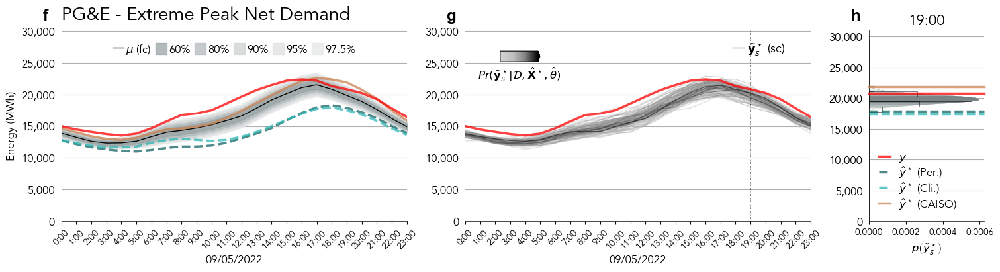

0 1


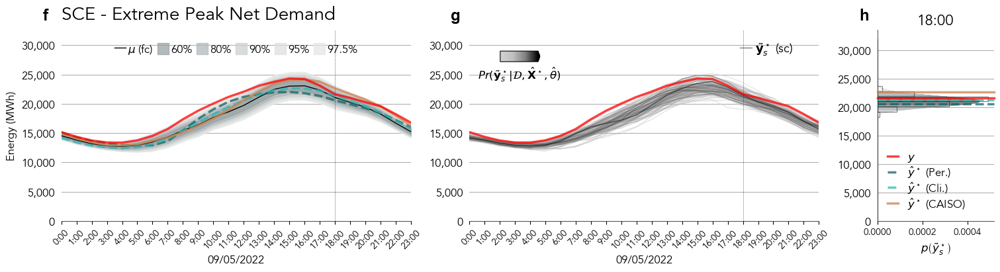

0 2


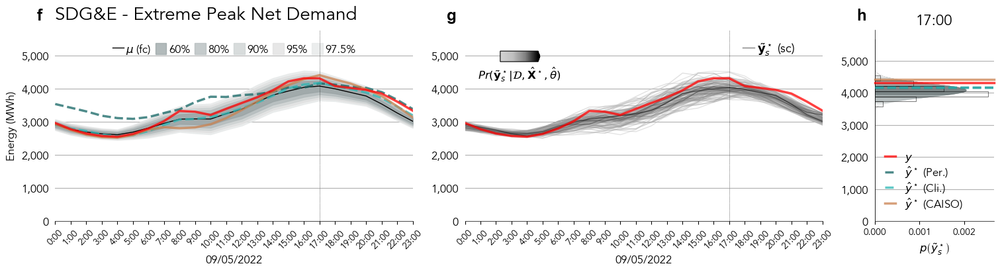

1 0


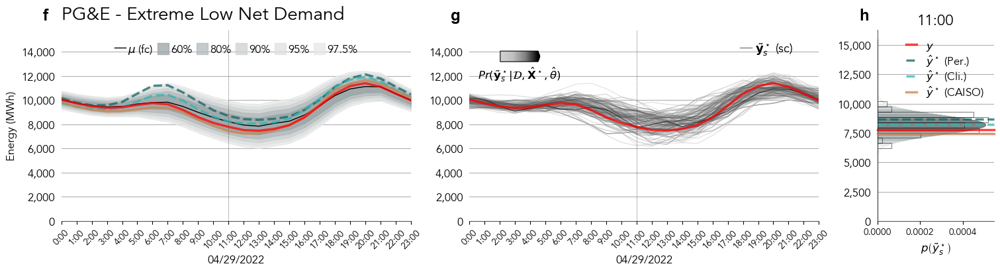

1 1


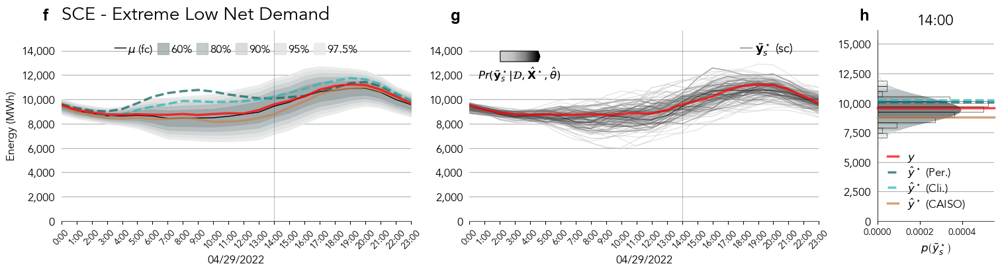

1 2


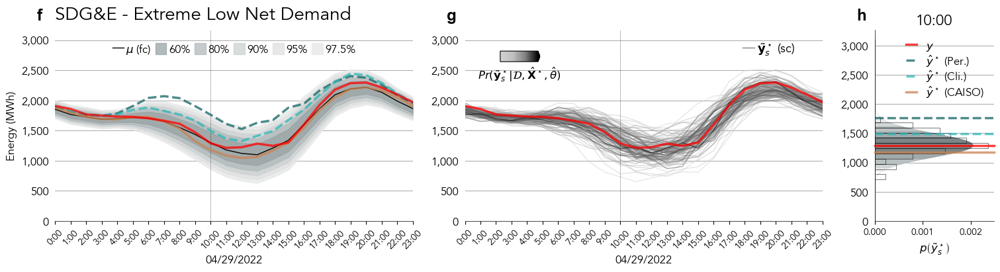

2 0


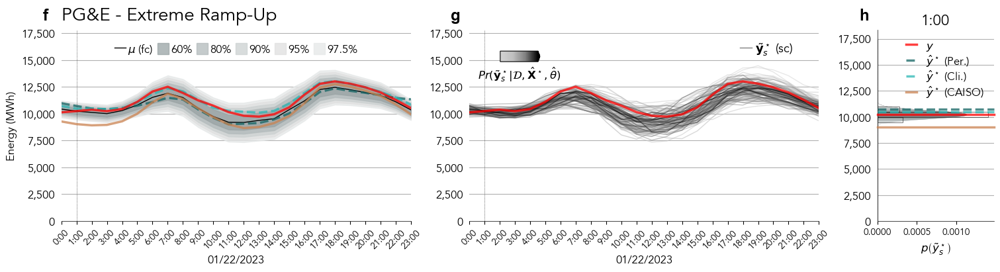

2 1


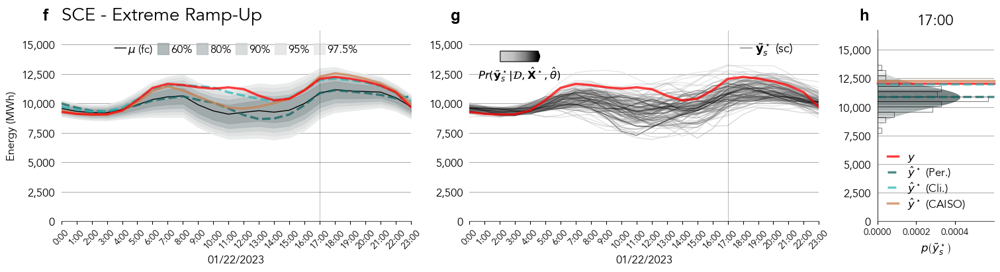

2 2


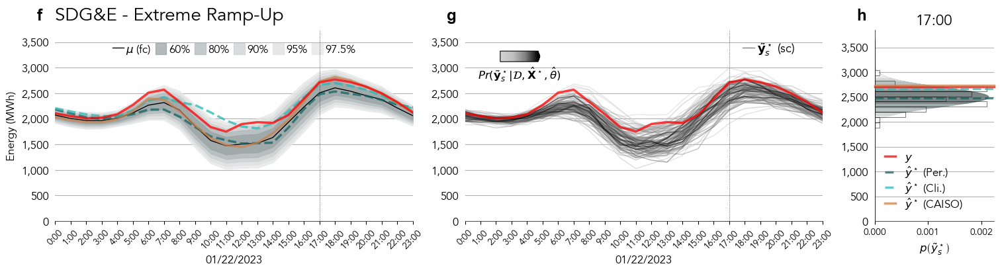

3 0


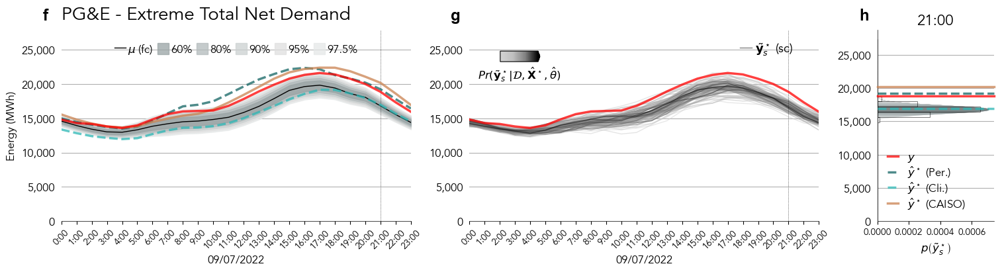

3 1


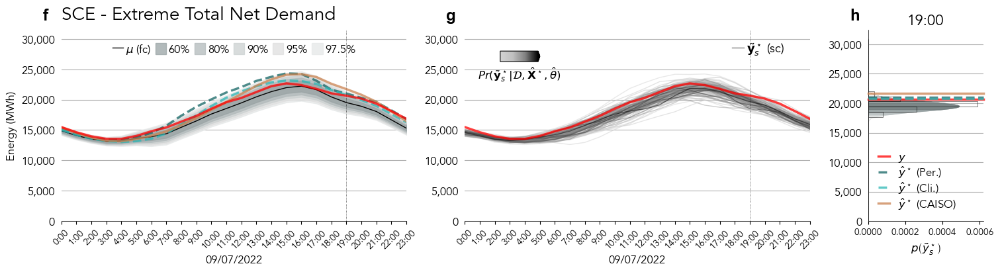

3 2


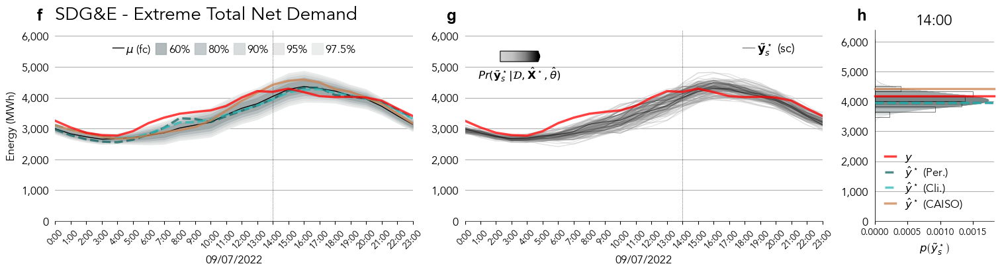

4 0


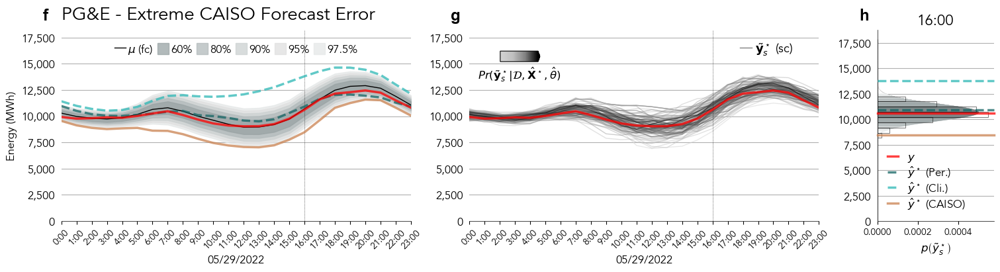

4 1


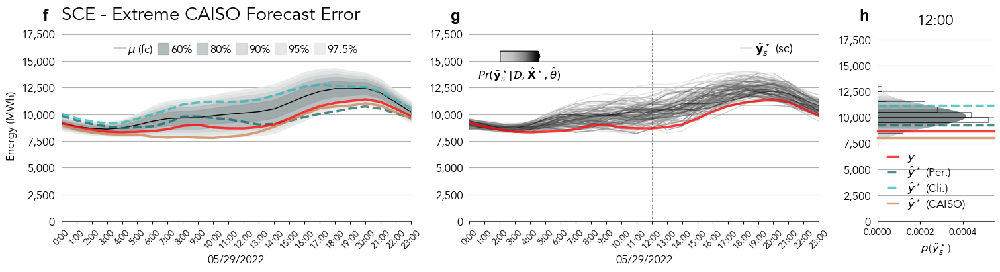

4 2


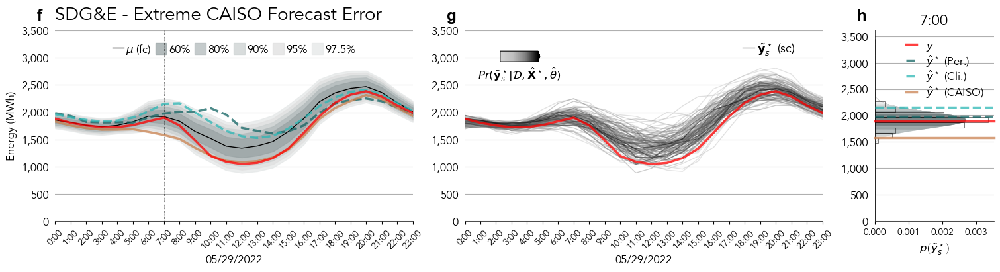

5 0


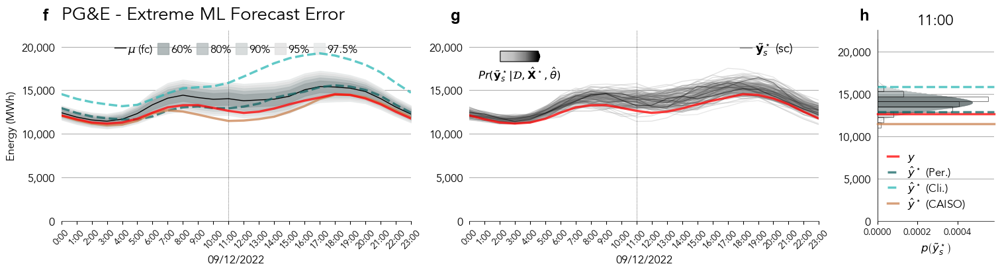

5 1


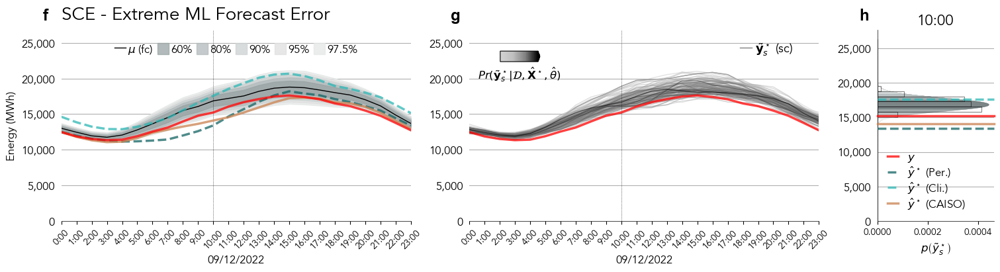

5 2


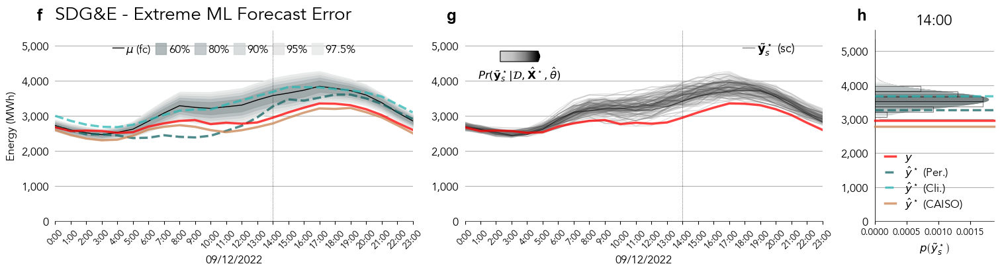

In [8]:
i_resource = 0

Y_       = _model_resource[i_resource]['targets']
Y_ml_    = _model_resource[i_resource]['mean']
S2_ml_   = np.sqrt(_model_resource[i_resource]['variance'])
Y_scens_ = _model_resource[i_resource]['samples']
print(Y_.shape, Y_ml_.shape, S2_ml_.shape, Y_scens_.shape)

Y_per_   = _baseline[i_resource]['persitence']
Y_clm_   = _baseline[i_resource]['climatology']
Y_caiso_ = _baseline[i_resource]['caiso']
print(Y_per_.shape, Y_clm_.shape, Y_caiso_.shape)

for i_sample, name, i_type in zip(samples_, labels_, range(len(samples_))):
    for i_zone in range(3):
        print(i_type, i_zone)

        y_       = Y_[i_sample, i_zone, :]
        mu_      = Y_ml_[i_sample, i_zone, :]
        s2_      = S2_ml_[i_sample, i_zone, :]
        y_per_   = Y_per_[i_sample, i_zone, :]
        y_clm_   = Y_clm_[i_sample, i_zone, :]
        y_iso_   = Y_caiso_[i_sample, i_zone, :]
        y_scens_ = Y_scens_[i_sample, i_zone, ...]  

        z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                         _model_resource[i_resource]['covariance'][i_sample, ...],
                         _model_resource[i_resource]['samples'][i_sample, ...])

        y_max  = np.max(mu_ + s2_)
        i_hour = np.argmax((y_iso_ - mu_)**2)
        
        fig, _ax = plt.subplot_mosaic([['f', 'g', 'h']], layout      = 'constrained', 
                                                         figsize     = (15, 4), 
                                                         gridspec_kw = {'width_ratios': [3, 3, 1]})
        
        cax = fig.add_axes([0.5, 0.78, 0.04, 0.04])

        for label, ax in _ax.items():
            ax.text(0.0, 1.0, label, transform = (ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
                                     fontsize  = 'xx-large', 
                                     weight    = "bold",
                                     va        = 'bottom', 
                                     family    = 'Arial')

        _plot_ci(_ax['f'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
                 i_hour     = i_hour,
                 y_min      = -1.,
                 y_max      = y_max*1.35,
                 label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
                 legend     = True, 
                 linestyle  = '-')

        _plot_scen(_ax['g'], cax, y_scens_, y_, mu_, z_,
                   i_hour       = i_hour,
                   y_min        = -1.,
                   label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
                   y_max        = y_max*1.35,
                   legend       = True, 
                   linestyle    = '-')

        _plot_detail(_ax['h'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
                     i_hour     = i_hour,
                     label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
                     nbins      = 35,
                     legend     = True, 
                     y_max      = y_max*1.325)

        _ax['f'].set_title(f'{zones_p_[i_zone]} - {name}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

        plt.savefig(path_to_images + 'is_demo_{}_{}-{}-{}.pdf'.format(i_type, resources_[i_resource], zones_[i_zone], i_sample), bbox_inches = 'tight', 
                                                                                                                                 dpi         = 300)


        plt.show()

(243, 3, 24) (243, 3, 24) (243, 3, 24) (243, 3, 24, 100)
(243, 3, 24) (243, 3, 24) (243, 3, 24)


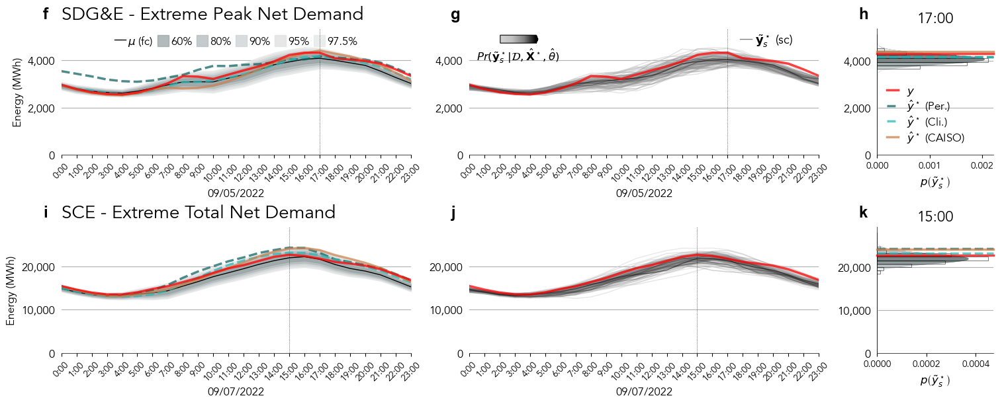

In [43]:
i_resource = 0

Y_       = _model_resource[i_resource]['targets']
Y_ml_    = _model_resource[i_resource]['mean']
S2_ml_   = np.sqrt(_model_resource[i_resource]['variance'])
Y_scens_ = _model_resource[i_resource]['samples']
print(Y_.shape, Y_ml_.shape, S2_ml_.shape, Y_scens_.shape)

Y_per_   = _baseline[i_resource]['persitence']
Y_clm_   = _baseline[i_resource]['climatology']
Y_caiso_ = _baseline[i_resource]['caiso']
print(Y_per_.shape, Y_clm_.shape, Y_caiso_.shape)

fig, _ax = plt.subplot_mosaic([['f', 'g', 'h'], 
                               ['i', 'j', 'k']], layout      = 'constrained', 
                                                 figsize     = (15, 6), 
                                                 gridspec_kw = {'width_ratios': [3, 3, 1]})

cax = fig.add_axes([0.5, 0.9, 0.04, 0.02])

for label, ax in _ax.items():
    ax.text(0.0, 1.0, label, transform = (ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
                             fontsize  = 'xx-large', 
                             weight    = "bold",
                             va        = 'bottom', 
                             family    = 'Arial')

i_type = 0
i_zone = 2
i_hour = 17

i_sample = samples_[i_type]
name     = labels_[i_type]

y_       = Y_[i_sample, i_zone, :]
mu_      = Y_ml_[i_sample, i_zone, :]
s2_      = S2_ml_[i_sample, i_zone, :]
y_per_   = Y_per_[i_sample, i_zone, :]
y_clm_   = Y_clm_[i_sample, i_zone, :]
y_iso_   = Y_caiso_[i_sample, i_zone, :]
y_scens_ = Y_scens_[i_sample, i_zone, ...]  

z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                 _model_resource[i_resource]['covariance'][i_sample, ...],
                 _model_resource[i_resource]['samples'][i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['f'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour     = i_hour,
         y_min      = -1.,
         y_max      = y_max*1.25,
         label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
         legend     = True, 
         linestyle  = '-')

_plot_scen(_ax['g'], cax, y_scens_, y_, mu_, z_,
           i_hour       = i_hour,
           y_min        = -1.,
           label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
           y_max        = y_max*1.25,
           legend       = True, 
           linestyle    = '-')

_plot_detail(_ax['h'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_hour     = i_hour,
             label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
             nbins      = 35,
             legend     = True, 
             y_max      = y_max*1.2)

_ax['f'].set_title(f'{zones_p_[i_zone]} - {name}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

i_type = 3
i_zone = 1
i_hour = 15

i_sample = samples_[i_type]
name     = labels_[i_type]

y_       = Y_[i_sample, i_zone, :]
mu_      = Y_ml_[i_sample, i_zone, :]
s2_      = S2_ml_[i_sample, i_zone, :]
y_per_   = Y_per_[i_sample, i_zone, :]
y_clm_   = Y_clm_[i_sample, i_zone, :]
y_iso_   = Y_caiso_[i_sample, i_zone, :]
y_scens_ = Y_scens_[i_sample, i_zone, ...]  

z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                 _model_resource[i_resource]['covariance'][i_sample, ...],
                 _model_resource[i_resource]['samples'][i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['i'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour     = i_hour,
         y_min      = -1.,
         y_max      = y_max*1.25,
         label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
         legend     = False, 
         linestyle  = '-')

_plot_scen(_ax['j'], cax, y_scens_, y_, mu_, z_,
           i_hour       = i_hour,
           y_min        = -1.,
           label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
           y_max        = y_max*1.25,
           legend       = False, 
           linestyle    = '-')

_plot_detail(_ax['k'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_hour     = i_hour,
             label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
             nbins      = 35,
             legend     = False, 
             y_max      = y_max*1.2)

_ax['i'].set_title(f'{zones_p_[i_zone]} - {name}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")


plt.savefig(path_to_images + 'is_demo_{}-{}.pdf'.format(resources_[i_resource], zones_[i_zone]), bbox_inches = 'tight', 
                                                                                                 dpi         = 300)


plt.show()

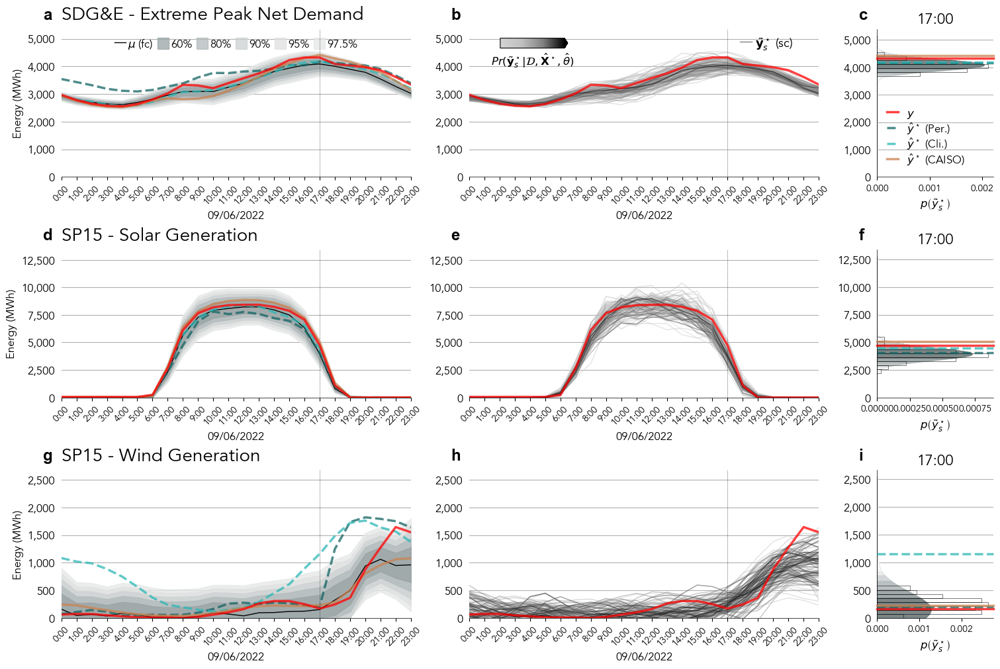

In [77]:
fig, _ax = plt.subplot_mosaic([['a', 'b', 'c'], 
                               ['d', 'e', 'f'],
                               ['g', 'h', 'i']], layout      = 'constrained', 
                                                 figsize     = (15, 10), 
                                                 gridspec_kw = {'width_ratios': [3, 3, 1]})

cax = fig.add_axes([0.5, 0.9325, 0.075, 0.015])

for label, ax in _ax.items():
    ax.text(0.0, 1.0, label, transform = (ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
                             fontsize  = 'xx-large', 
                             weight    = "bold",
                             va        = 'bottom', 
                             family    = 'Arial')

i_resource = 0
i_type     = 0
i_zone     = 2
i_hour     = 17
i_sample   = samples_[i_type]
name       = labels_[i_type]

Y_       = _model_resource[i_resource]['targets']
Y_ml_    = _model_resource[i_resource]['mean']
S2_ml_   = np.sqrt(_model_resource[i_resource]['variance'])
Y_scens_ = _model_resource[i_resource]['samples']
Y_per_   = _baseline[i_resource]['persitence']
Y_clm_   = _baseline[i_resource]['climatology']
Y_caiso_ = _baseline[i_resource]['caiso']

y_       = Y_[i_sample, i_zone, :]
mu_      = Y_ml_[i_sample, i_zone, :]
s2_      = S2_ml_[i_sample, i_zone, :]
y_per_   = Y_per_[i_sample, i_zone, :]
y_clm_   = Y_clm_[i_sample, i_zone, :]
y_iso_   = Y_caiso_[i_sample, i_zone, :]
y_scens_ = Y_scens_[i_sample, i_zone, ...]  

# print(y_)
# print(mu_)
# # print(mu_ + 2.24*s2_)
# print(np.absolute((y_ - y_iso_)/y_))

z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                 _model_resource[i_resource]['covariance'][i_sample, ...],
                 _model_resource[i_resource]['samples'][i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['a'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour     = i_hour,
         y_min      = -1.,
         y_max      = y_max*1.25,
         label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
         legend     = True, 
         linestyle  = '-')

_plot_scen(_ax['b'], cax, y_scens_, y_, mu_, z_,
           i_hour       = i_hour,
           y_min        = -1.,
           label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
           y_max        = y_max*1.25,
           legend       = True, 
           linestyle    = '-')

_plot_detail(_ax['c'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_hour     = i_hour,
             label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
             nbins      = 35,
             legend     = True, 
             y_max      = y_max*1.2)

_ax['a'].set_title(f'{zones_p_[i_zone]} - {name}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

i_resource = 1
i_type     = 0
i_zone     = 1
i_hour     = 17
i_sample   = samples_[i_type]
name       = labels_[i_type]

Y_       = _model_resource[i_resource]['targets']
Y_ml_    = _model_resource[i_resource]['mean']
S2_ml_   = np.sqrt(_model_resource[i_resource]['variance'])
Y_scens_ = _model_resource[i_resource]['samples']
Y_per_   = _baseline[i_resource]['persitence']
Y_clm_   = _baseline[i_resource]['climatology']
Y_caiso_ = _baseline[i_resource]['caiso']

y_       = Y_[i_sample, i_zone, :]
mu_      = Y_ml_[i_sample, i_zone, :]
s2_      = S2_ml_[i_sample, i_zone, :]
y_per_   = Y_per_[i_sample, i_zone, :]
y_clm_   = Y_clm_[i_sample, i_zone, :]
y_iso_   = Y_caiso_[i_sample, i_zone, :]
y_scens_ = Y_scens_[i_sample, i_zone, ...]  

# print(np.absolute(y_ - y_iso_)[8:16].mean())
# print(np.absolute((y_ - y_iso_)/y_)[8:16].mean())
# print(np.absolute(y_ - y_per_)[8:16].mean())
# print(np.absolute((y_ - y_per_)/y_)[8:16].mean())
# print(np.absolute(y_ - y_clm_)[8:16].mean())
# print(np.absolute((y_ - y_clm_)/y_)[8:16].mean())

z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                 _model_resource[i_resource]['covariance'][i_sample, ...],
                 _model_resource[i_resource]['samples'][i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['d'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour     = i_hour,
         y_min      = -1.,
         y_max      = y_max*1.5,
         label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
         legend     = False, 
         linestyle  = '-')

_plot_scen(_ax['e'], cax, y_scens_, y_, mu_, z_,
           i_hour       = i_hour,
           y_min        = -1.,
           label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
           y_max        = y_max*1.5,
           legend       = False, 
           linestyle    = '-')

_plot_detail(_ax['f'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_hour     = i_hour,
             label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
             nbins      = 35,
             legend     = False, 
             y_max      = y_max*1.425)

_ax['d'].set_title(f'{zones_[i_zone]} - Solar Generation', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

i_resource = 2
i_type     = 0
i_zone     = 1
i_hour     = 17
i_sample   = samples_[i_type]
name       = labels_[i_type]

Y_       = _model_resource[i_resource]['targets']
Y_ml_    = _model_resource[i_resource]['mean']
S2_ml_   = np.sqrt(_model_resource[i_resource]['variance'])
Y_scens_ = _model_resource[i_resource]['samples']
Y_per_   = _baseline[i_resource]['persitence']
Y_clm_   = _baseline[i_resource]['climatology']
Y_caiso_ = _baseline[i_resource]['caiso']

y_       = Y_[i_sample, i_zone, :]
mu_      = Y_ml_[i_sample, i_zone, :]
s2_      = S2_ml_[i_sample, i_zone, :]
y_per_   = Y_per_[i_sample, i_zone, :]
y_clm_   = Y_clm_[i_sample, i_zone, :]
y_iso_   = Y_caiso_[i_sample, i_zone, :]
y_scens_ = Y_scens_[i_sample, i_zone, ...]  


z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                 _model_resource[i_resource]['covariance'][i_sample, ...],
                 _model_resource[i_resource]['samples'][i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['g'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour     = i_hour,
         y_min      = -1.,
         y_max      = y_max*2,
         label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
         legend     = False, 
         linestyle  = '-')

_plot_scen(_ax['h'], cax, y_scens_, y_, mu_, z_,
           i_hour       = i_hour,
           y_min        = -1.,
           label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
           y_max        = y_max*2,
           legend       = False, 
           linestyle    = '-')

_plot_detail(_ax['i'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_hour     = i_hour,
             label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
             nbins      = 35,
             legend     = False, 
             y_max      = y_max*1.9)

_ax['g'].set_title(f'{zones_[i_zone]} - Wind Generation', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

plt.savefig(path_to_images + 'is_demo_{}-{}-{}.pdf'.format(i_type, zones_[i_zone], i_sample), 
            bbox_inches = 'tight', 
            dpi         = 300)


plt.show()

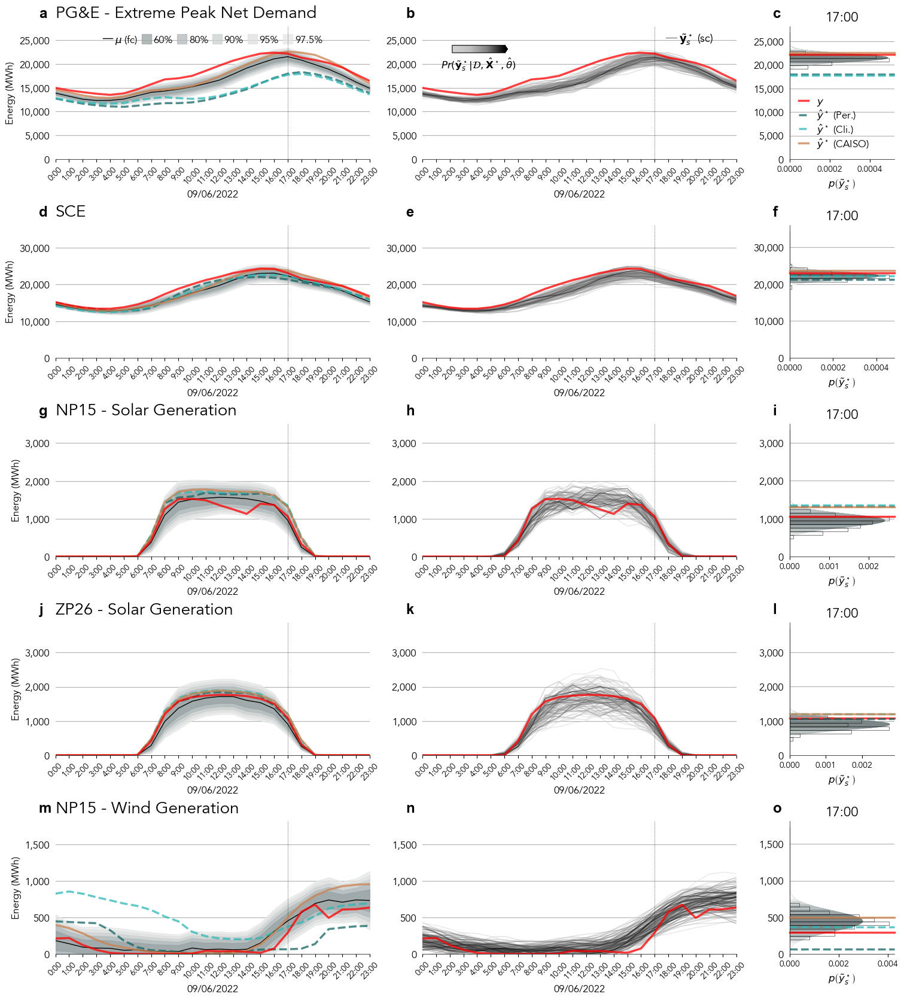

In [79]:
fig, _ax = plt.subplot_mosaic([['a', 'b', 'c'], 
                               ['d', 'e', 'f'],
                               ['g', 'h', 'i'],
                               ['j', 'k', 'l'],
                               ['m', 'n', 'o']], layout      = 'constrained', 
                                                 figsize     = (15, 16.6), 
                                                 gridspec_kw = {'width_ratios': [3, 3, 1]})

cax = fig.add_axes([0.5, 0.95, 0.075, 0.0075])

for label, ax in _ax.items():
    ax.text(0.0, 1.0, label, transform = (ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
                             fontsize  = 'xx-large', 
                             weight    = "bold",
                             va        = 'bottom', 
                             family    = 'Arial')

i_resource = 0
i_type     = 0
i_zone     = 0
i_hour     = 17
i_sample   = samples_[i_type]
name       = labels_[i_type]

Y_       = _model_resource[i_resource]['targets']
Y_ml_    = _model_resource[i_resource]['mean']
S2_ml_   = np.sqrt(_model_resource[i_resource]['variance'])
Y_scens_ = _model_resource[i_resource]['samples']
Y_per_   = _baseline[i_resource]['persitence']
Y_clm_   = _baseline[i_resource]['climatology']
Y_caiso_ = _baseline[i_resource]['caiso']

y_       = Y_[i_sample, i_zone, :]
mu_      = Y_ml_[i_sample, i_zone, :]
s2_      = S2_ml_[i_sample, i_zone, :]
y_per_   = Y_per_[i_sample, i_zone, :]
y_clm_   = Y_clm_[i_sample, i_zone, :]
y_iso_   = Y_caiso_[i_sample, i_zone, :]
y_scens_ = Y_scens_[i_sample, i_zone, ...]  

z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                 _model_resource[i_resource]['covariance'][i_sample, ...],
                 _model_resource[i_resource]['samples'][i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['a'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour     = i_hour,
         y_min      = -1.,
         y_max      = y_max*1.25,
         label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
         legend     = True, 
         linestyle  = '-')

_plot_scen(_ax['b'], cax, y_scens_, y_, mu_, z_,
           i_hour       = i_hour,
           y_min        = -1.,
           label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
           y_max        = y_max*1.25,
           legend       = True, 
           linestyle    = '-')

_plot_detail(_ax['c'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_hour     = i_hour,
             label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
             nbins      = 35,
             legend     = True, 
             y_max      = y_max*1.2)

_ax['a'].set_title(f'{zones_p_[i_zone]} - {name}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

i_resource = 0
#i_type     = 3
i_zone     = 1
#i_hour     = 17
i_sample   = samples_[i_type]
name       = labels_[i_type]

Y_       = _model_resource[i_resource]['targets']
Y_ml_    = _model_resource[i_resource]['mean']
S2_ml_   = np.sqrt(_model_resource[i_resource]['variance'])
Y_scens_ = _model_resource[i_resource]['samples']
Y_per_   = _baseline[i_resource]['persitence']
Y_clm_   = _baseline[i_resource]['climatology']
Y_caiso_ = _baseline[i_resource]['caiso']

y_       = Y_[i_sample, i_zone, :]
mu_      = Y_ml_[i_sample, i_zone, :]
s2_      = S2_ml_[i_sample, i_zone, :]
y_per_   = Y_per_[i_sample, i_zone, :]
y_clm_   = Y_clm_[i_sample, i_zone, :]
y_iso_   = Y_caiso_[i_sample, i_zone, :]
y_scens_ = Y_scens_[i_sample, i_zone, ...]  

z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                 _model_resource[i_resource]['covariance'][i_sample, ...],
                 _model_resource[i_resource]['samples'][i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['d'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour     = i_hour,
         y_min      = -1.,
         y_max      = y_max*1.5,
         label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
         legend     = False, 
         linestyle  = '-')

_plot_scen(_ax['e'], cax, y_scens_, y_, mu_, z_,
           i_hour       = i_hour,
           y_min        = -1.,
           label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
           y_max        = y_max*1.5,
           legend       = False, 
           linestyle    = '-')

_plot_detail(_ax['f'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_hour     = i_hour,
             label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
             nbins      = 35,
             legend     = False, 
             y_max      = y_max*1.425)

_ax['d'].set_title(f'{zones_p_[i_zone]}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

i_resource = 1
#i_type     = 3
i_zone     = 0
#i_hour     = 17
i_sample   = samples_[i_type]
name       = labels_[i_type]

Y_       = _model_resource[i_resource]['targets']
Y_ml_    = _model_resource[i_resource]['mean']
S2_ml_   = np.sqrt(_model_resource[i_resource]['variance'])
Y_scens_ = _model_resource[i_resource]['samples']
Y_per_   = _baseline[i_resource]['persitence']
Y_clm_   = _baseline[i_resource]['climatology']
Y_caiso_ = _baseline[i_resource]['caiso']

y_       = Y_[i_sample, i_zone, :]
mu_      = Y_ml_[i_sample, i_zone, :]
s2_      = S2_ml_[i_sample, i_zone, :]
y_per_   = Y_per_[i_sample, i_zone, :]
y_clm_   = Y_clm_[i_sample, i_zone, :]
y_iso_   = Y_caiso_[i_sample, i_zone, :]
y_scens_ = Y_scens_[i_sample, i_zone, ...]  

z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                 _model_resource[i_resource]['covariance'][i_sample, ...],
                 _model_resource[i_resource]['samples'][i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['g'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour     = i_hour,
         y_min      = -1.,
         y_max      = y_max*2,
         label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
         legend     = False, 
         linestyle  = '-')

_plot_scen(_ax['h'], cax, y_scens_, y_, mu_, z_,
           i_hour       = i_hour,
           y_min        = -1.,
           label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
           y_max        = y_max*2,
           legend       = False, 
           linestyle    = '-')

_plot_detail(_ax['i'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_hour     = i_hour,
             label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
             nbins      = 35,
             legend     = False, 
             y_max      = y_max*1.9)

_ax['g'].set_title(f'{zones_[i_zone]} - Solar Generation', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

i_resource = 1
#i_type     = 3
i_zone     = 2
#i_hour     = 17
i_sample   = samples_[i_type]
name       = labels_[i_type]

Y_       = _model_resource[i_resource]['targets']
Y_ml_    = _model_resource[i_resource]['mean']
S2_ml_   = np.sqrt(_model_resource[i_resource]['variance'])
Y_scens_ = _model_resource[i_resource]['samples']
Y_per_   = _baseline[i_resource]['persitence']
Y_clm_   = _baseline[i_resource]['climatology']
Y_caiso_ = _baseline[i_resource]['caiso']

y_       = Y_[i_sample, i_zone, :]
mu_      = Y_ml_[i_sample, i_zone, :]
s2_      = S2_ml_[i_sample, i_zone, :]
y_per_   = Y_per_[i_sample, i_zone, :]
y_clm_   = Y_clm_[i_sample, i_zone, :]
y_iso_   = Y_caiso_[i_sample, i_zone, :]
y_scens_ = Y_scens_[i_sample, i_zone, ...]  

z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                 _model_resource[i_resource]['covariance'][i_sample, ...],
                 _model_resource[i_resource]['samples'][i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['j'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour     = i_hour,
         y_min      = -1.,
         y_max      = y_max*2,
         label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
         legend     = False, 
         linestyle  = '-')

_plot_scen(_ax['k'], cax, y_scens_, y_, mu_, z_,
           i_hour       = i_hour,
           y_min        = -1.,
           label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
           y_max        = y_max*2,
           legend       = False, 
           linestyle    = '-')

_plot_detail(_ax['l'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_hour     = i_hour,
             label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
             nbins      = 35,
             legend     = False, 
             y_max      = y_max*1.9)

_ax['j'].set_title(f'{zones_[i_zone]} - Solar Generation', fontsize = 20, y = 1.025, weight = "bold", loc = "left")


i_resource = 2
#i_type     = 3
i_zone     = 0
#i_hour     = 17
i_sample   = samples_[i_type]
name       = labels_[i_type]

Y_       = _model_resource[i_resource]['targets']
Y_ml_    = _model_resource[i_resource]['mean']
S2_ml_   = np.sqrt(_model_resource[i_resource]['variance'])
Y_scens_ = _model_resource[i_resource]['samples']
Y_per_   = _baseline[i_resource]['persitence']
Y_clm_   = _baseline[i_resource]['climatology']
Y_caiso_ = _baseline[i_resource]['caiso']

y_       = Y_[i_sample, i_zone, :]
mu_      = Y_ml_[i_sample, i_zone, :]
s2_      = S2_ml_[i_sample, i_zone, :]
y_per_   = Y_per_[i_sample, i_zone, :]
y_clm_   = Y_clm_[i_sample, i_zone, :]
y_iso_   = Y_caiso_[i_sample, i_zone, :]
y_scens_ = Y_scens_[i_sample, i_zone, ...]  

z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                 _model_resource[i_resource]['covariance'][i_sample, ...],
                 _model_resource[i_resource]['samples'][i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['m'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour     = i_hour,
         y_min      = -1.,
         y_max      = y_max*2,
         label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
         legend     = False, 
         linestyle  = '-')

_plot_scen(_ax['n'], cax, y_scens_, y_, mu_, z_,
           i_hour       = i_hour,
           y_min        = -1.,
           label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
           y_max        = y_max*2,
           legend       = False, 
           linestyle    = '-')

_plot_detail(_ax['o'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_hour     = i_hour,
             label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample + 1, 'date']),
             nbins      = 35,
             legend     = False, 
             y_max      = y_max*1.9)

_ax['m'].set_title(f'{zones_[i_zone]} - Wind Generation', fontsize = 20, y = 1.025, weight = "bold", loc = "left")


plt.savefig(path_to_images + 'is_demo_{}-{}.pdf'.format(i_type, i_sample), 
            bbox_inches = 'tight', 
            dpi         = 300)


plt.show()

## Solar Gen. Forecast

(243, 3, 24) (243, 3, 24) (243, 3, 24) (243, 3, 24, 100)
(243, 3, 24) (243, 3, 24) (243, 3, 24)
0 0


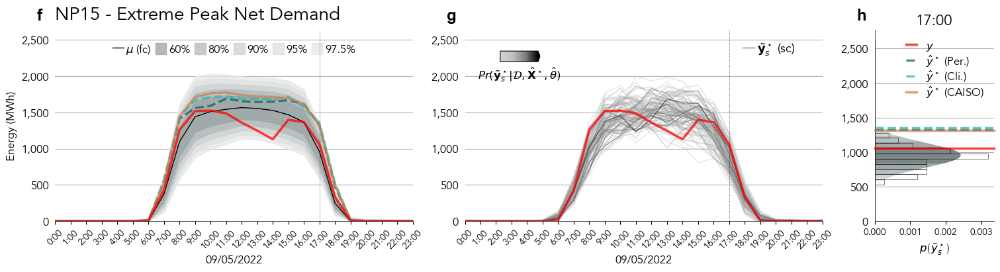

0 1


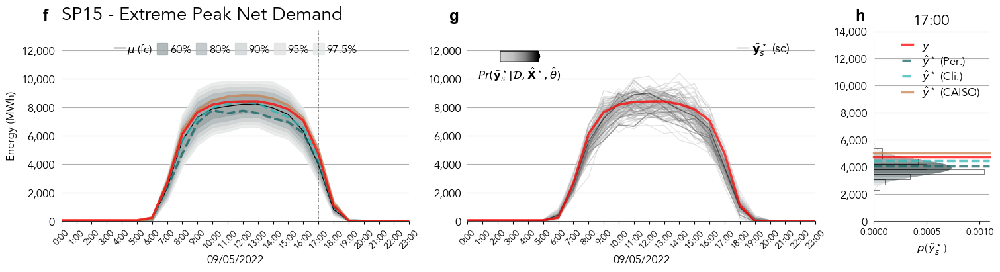

0 2


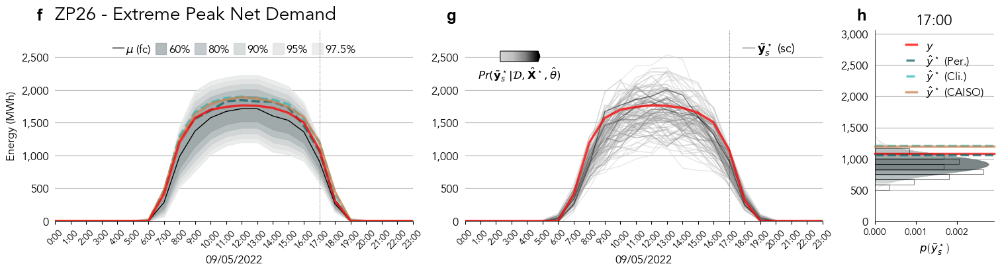

1 0


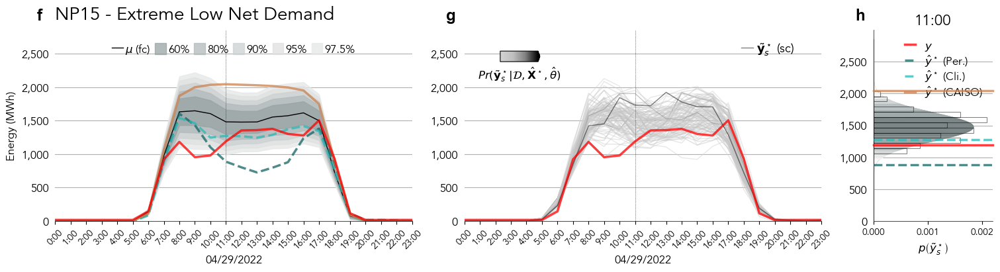

1 1


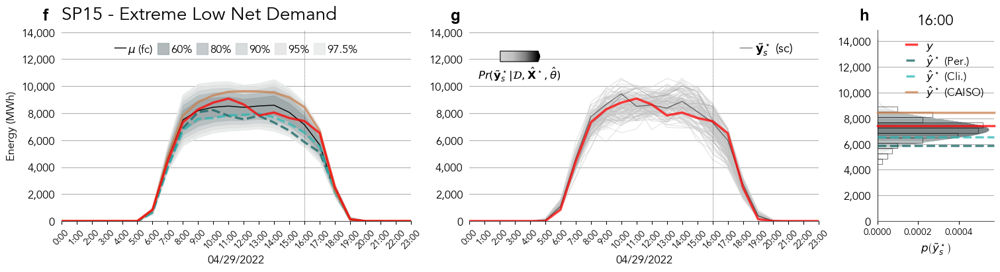

1 2


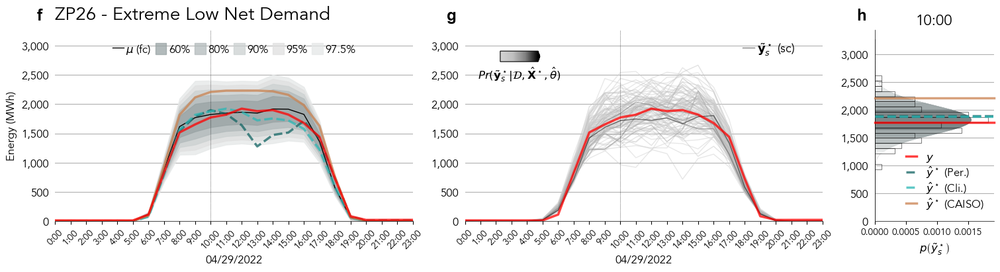

2 0


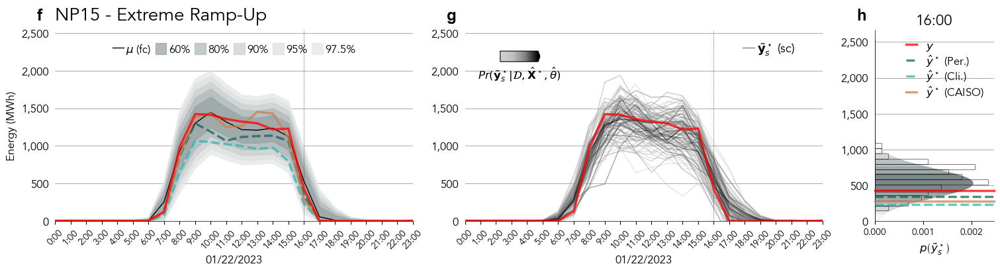

2 1


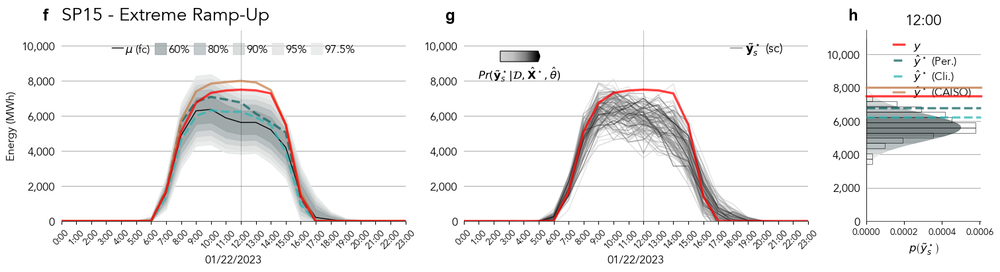

2 2


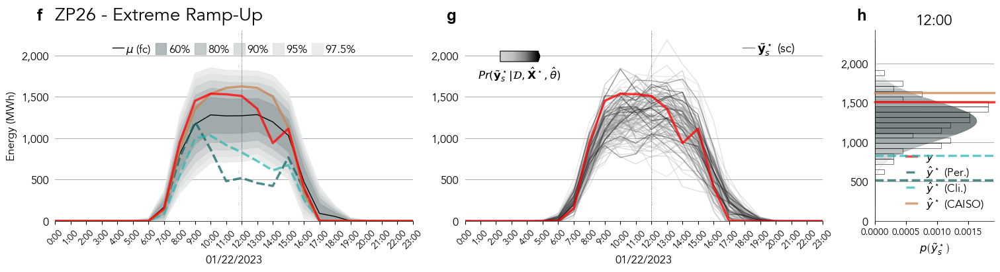

3 0


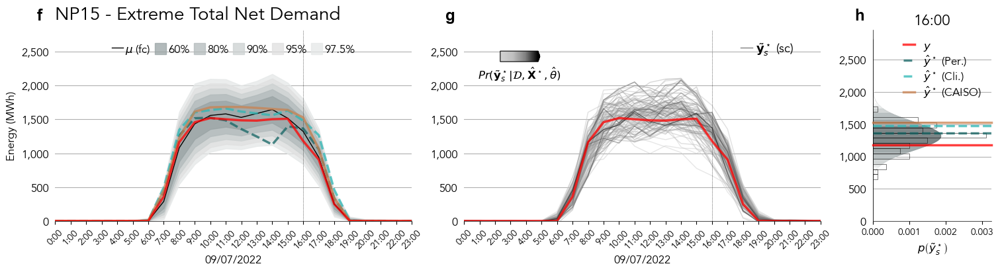

3 1


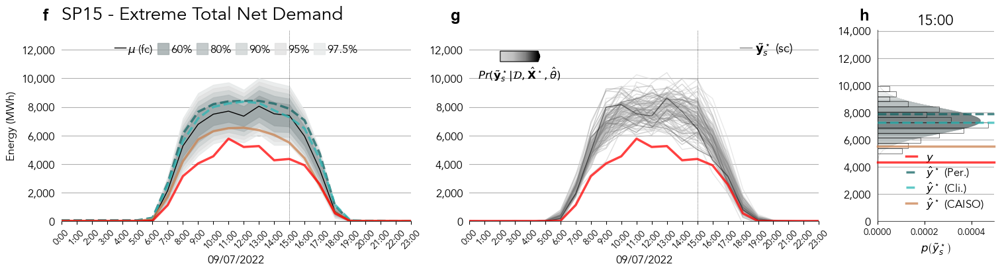

3 2


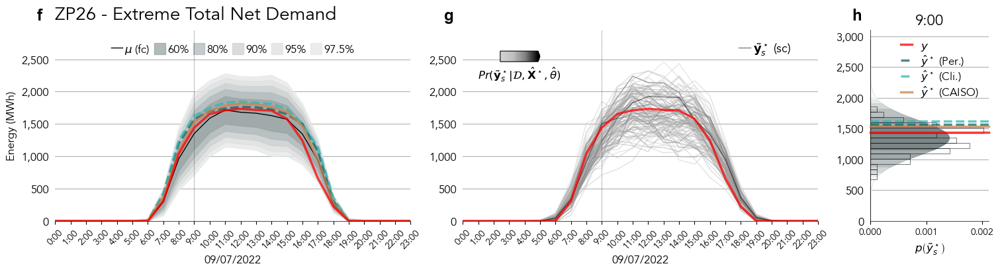

4 0


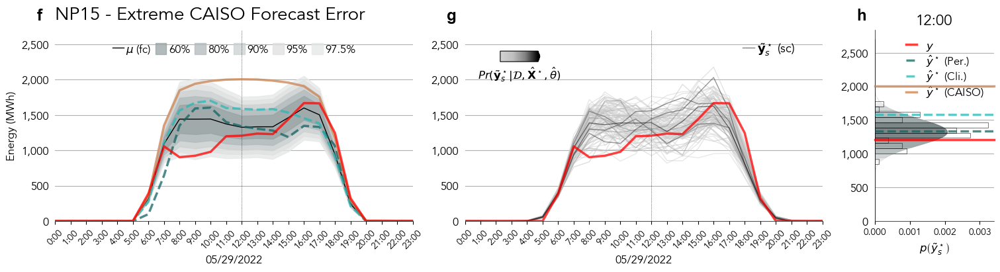

4 1


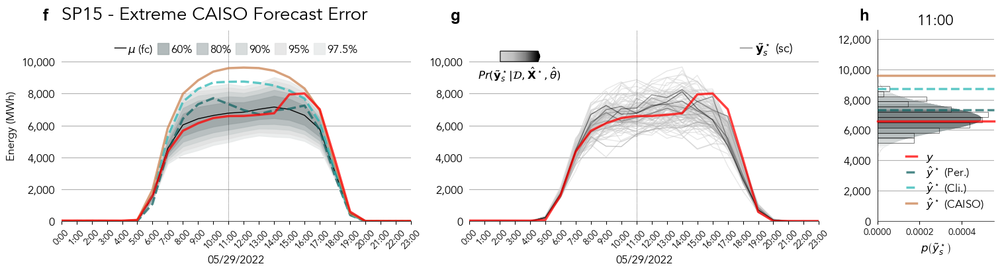

4 2


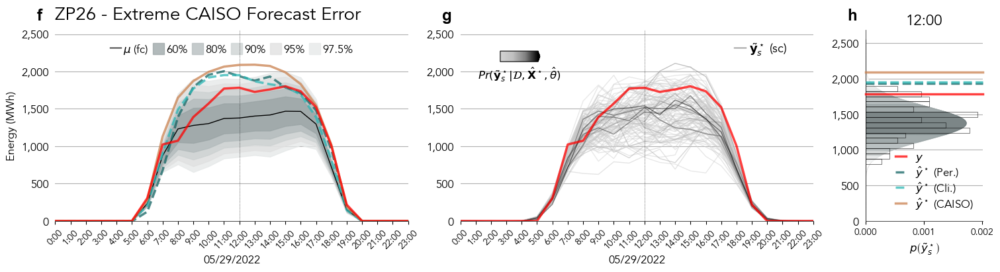

5 0


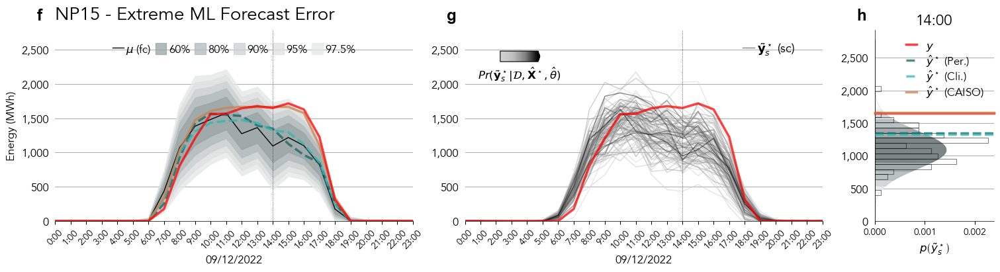

5 1


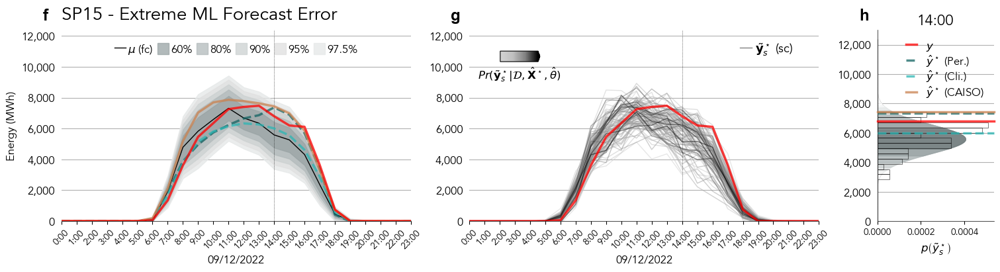

5 2


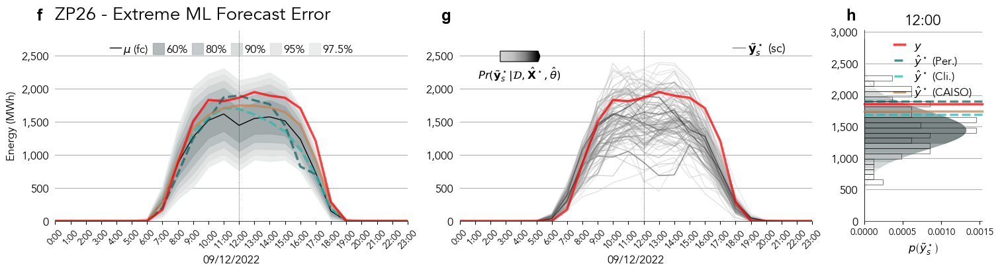

In [12]:
i_resource = 1

Y_       = _model_resource[i_resource]['targets']
Y_ml_    = _model_resource[i_resource]['mean']
S2_ml_   = np.sqrt(_model_resource[i_resource]['variance'])
Y_scens_ = _model_resource[i_resource]['samples']
print(Y_.shape, Y_ml_.shape, S2_ml_.shape, Y_scens_.shape)

Y_per_   = _baseline[i_resource]['persitence']
Y_clm_   = _baseline[i_resource]['climatology']
Y_caiso_ = _baseline[i_resource]['caiso']
print(Y_per_.shape, Y_clm_.shape, Y_caiso_.shape)

for i_sample, name, i_type in zip(samples_, labels_, range(len(samples_))):
    for i_zone in range(3):
        print(i_type, i_zone)

        y_       = Y_[i_sample, i_zone, :]
        mu_      = Y_ml_[i_sample, i_zone, :]
        s2_      = S2_ml_[i_sample, i_zone, :]
        y_per_   = Y_per_[i_sample, i_zone, :]
        y_clm_   = Y_clm_[i_sample, i_zone, :]
        y_iso_   = Y_caiso_[i_sample, i_zone, :]
        y_scens_ = Y_scens_[i_sample, i_zone, ...]  

        z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                         _model_resource[i_resource]['covariance'][i_sample, ...],
                         _model_resource[i_resource]['samples'][i_sample, ...])

        y_max  = np.max(mu_ + s2_)
        i_hour = np.argmax((y_iso_ - mu_)**2)

        fig, _ax = plt.subplot_mosaic([['f', 'g', 'h']], layout      = 'constrained', 
                                                         figsize     = (15, 4), 
                                                         gridspec_kw = {'width_ratios': [3, 3, 1]})
        
        cax = fig.add_axes([0.5, 0.78, 0.04, 0.04])

        for label, ax in _ax.items():
            ax.text(0.0, 1.0, label, transform = (ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
                                     fontsize  = 'xx-large', 
                                     weight    = "bold",
                                     va        = 'bottom',
                                     family    = 'Arial')
            
        _plot_ci(_ax['f'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
                 i_hour     = i_hour,
                 y_min      = -1.,
                 y_max      = y_max*1.5,
                 label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
                 legend     = True, 
                 linestyle  = '-')

        _plot_scen(_ax['g'], cax, y_scens_, y_, mu_, z_,
                   i_hour       = i_hour,
                   y_min        = -1.,
                   label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
                   y_max        = y_max*1.5,
                   legend       = True, 
                   linestyle    = '-')

        _plot_detail(_ax['h'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
                     i_hour     = i_hour,
                     label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
                     nbins      = 35,
                     legend     = True, 
                     y_max      = y_max*1.5)

        _ax['f'].set_title(f'{zones_[i_zone]} - {name}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

        plt.savefig(path_to_images + 'is_demo_{}_{}-{}-{}.pdf'.format(i_type, resources_[i_resource], zones_[i_zone], i_sample), bbox_inches = 'tight', 
                                                                                                         dpi         = 300)

        plt.show()

(243, 3, 24) (243, 3, 24) (243, 3, 24) (243, 3, 24, 100)
(243, 3, 24) (243, 3, 24) (243, 3, 24)


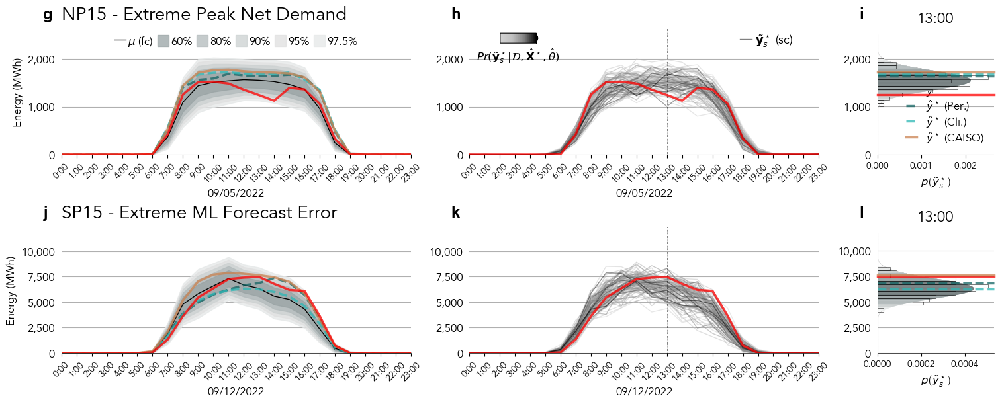

In [13]:
fig, _ax = plt.subplot_mosaic([['g', 'h', 'i'], 
                               ['j', 'k', 'l']], layout      = 'constrained', 
                                                 figsize     = (15, 6), 
                                                 gridspec_kw = {'width_ratios': [3, 3, 1]})

cax = fig.add_axes([0.5, 0.9, 0.04, 0.025])

for label, ax in _ax.items():
    ax.text(0.0, 1.0, label, transform = (ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
                             fontsize  = 'xx-large', 
                             weight    = "bold",
                             va        = 'bottom',
                             family    = 'Arial')

i_resource = 1

Y_       = _model_resource[i_resource]['targets']
Y_ml_    = _model_resource[i_resource]['mean']
S2_ml_   = np.sqrt(_model_resource[i_resource]['variance'])
Y_scens_ = _model_resource[i_resource]['samples']
print(Y_.shape, Y_ml_.shape, S2_ml_.shape, Y_scens_.shape)

Y_per_   = _baseline[i_resource]['persitence']
Y_clm_   = _baseline[i_resource]['climatology']
Y_caiso_ = _baseline[i_resource]['caiso']
print(Y_per_.shape, Y_clm_.shape, Y_caiso_.shape)

    
i_type   = 0
i_zone   = 0
i_hour   = 13
i_sample = samples_[i_type]
name     = labels_[i_type]

y_       = Y_[i_sample, i_zone, :]
mu_      = Y_ml_[i_sample, i_zone, :]
s2_      = S2_ml_[i_sample, i_zone, :]
y_per_   = Y_per_[i_sample, i_zone, :]
y_clm_   = Y_clm_[i_sample, i_zone, :]
y_iso_   = Y_caiso_[i_sample, i_zone, :]
y_scens_ = Y_scens_[i_sample, i_zone, ...]  


z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                 _model_resource[i_resource]['covariance'][i_sample, ...],
                 _model_resource[i_resource]['samples'][i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['g'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour     = i_hour,
         y_min      = -1.,
         y_max      = y_max*1.5,
         label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
         legend     = True, 
         linestyle  = '-')

_plot_scen(_ax['h'], cax, y_scens_, y_, mu_, z_,
           i_hour       = i_hour,
           y_min        = -1.,
           label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
           y_max        = y_max*1.5,
           legend       = True, 
           linestyle    = '-')

_plot_detail(_ax['i'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_hour     = i_hour,
             label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
             nbins      = 35,
             legend     = True, 
             y_max      = y_max*1.425)

_ax['g'].set_title(f'{zones_[i_zone]} - {name}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

i_type   = 5
i_zone   = 1
i_hour   = 13
i_sample = samples_[i_type]
name     = labels_[i_type]

y_       = Y_[i_sample, i_zone, :]
mu_      = Y_ml_[i_sample, i_zone, :]
s2_      = S2_ml_[i_sample, i_zone, :]
y_per_   = Y_per_[i_sample, i_zone, :]
y_clm_   = Y_clm_[i_sample, i_zone, :]
y_iso_   = Y_caiso_[i_sample, i_zone, :]
y_scens_ = Y_scens_[i_sample, i_zone, ...]  


z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                 _model_resource[i_resource]['covariance'][i_sample, ...],
                 _model_resource[i_resource]['samples'][i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['j'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour     = i_hour,
         y_min      = -1.,
         y_max      = y_max*1.5,
         label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
         legend     = False, 
         linestyle  = '-')

_plot_scen(_ax['k'], cax, y_scens_, y_, mu_, z_,
           i_hour       = i_hour,
           y_min        = -1.,
           label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
           y_max        = y_max*1.5,
           legend       = False, 
           linestyle    = '-')

_plot_detail(_ax['l'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_hour     = i_hour,
             label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
             nbins      = 35,
             legend     = False, 
             y_max      = y_max*1.425)

_ax['j'].set_title(f'{zones_[i_zone]} - {name}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")


plt.savefig(path_to_images + 'is_demo_{}-{}.pdf'.format(resources_[i_resource], zones_[i_zone]), 
            bbox_inches = 'tight', 
            dpi         = 300)

plt.show()

## Wind Gen. Forecast

(243, 2, 24) (243, 2, 24) (243, 2, 24) (243, 2, 24, 100)
(243, 2, 24) (243, 2, 24) (243, 2, 24)
0 0


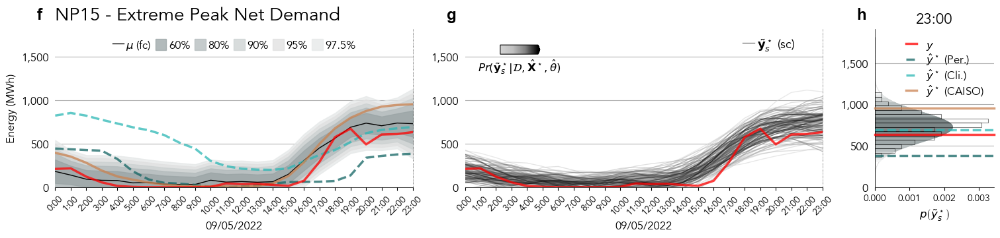

0 1


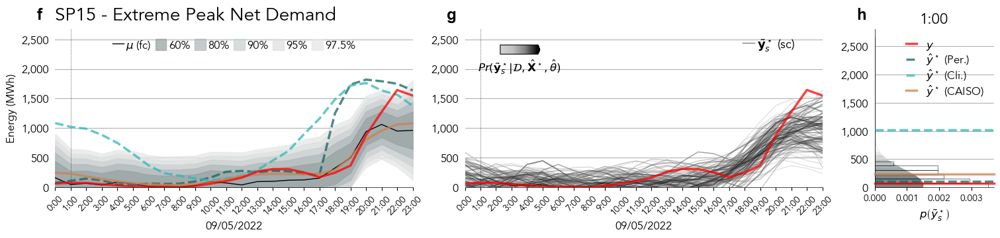

1 0


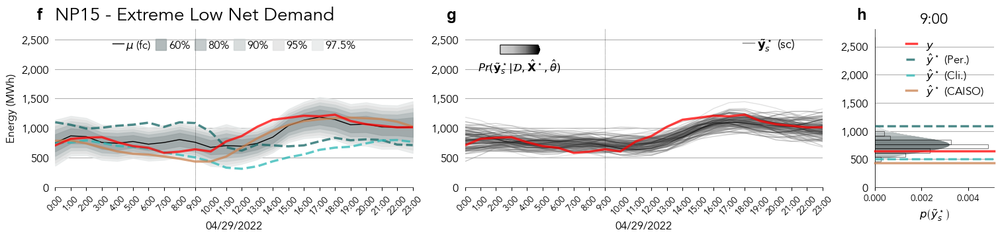

1 1


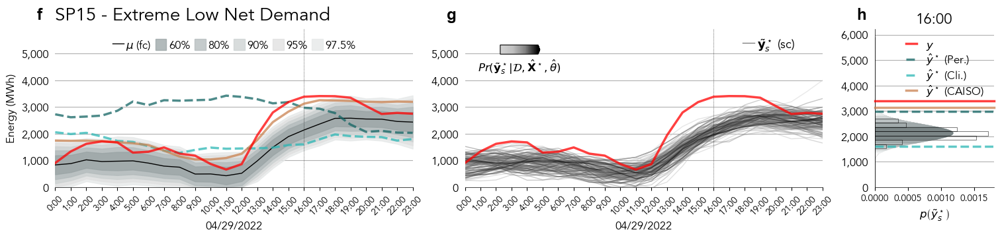

2 0


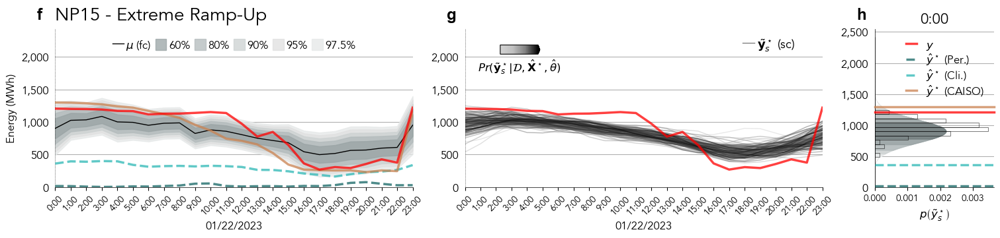

2 1


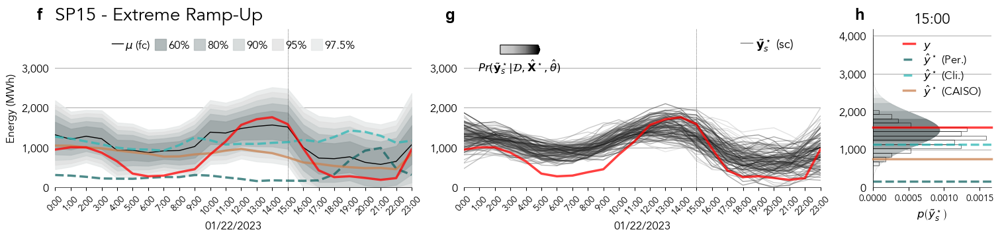

3 0


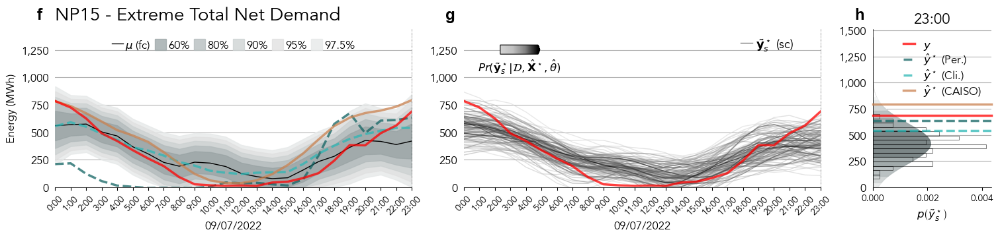

3 1


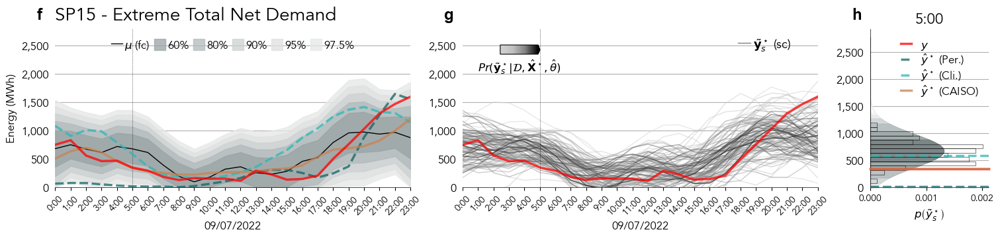

4 0


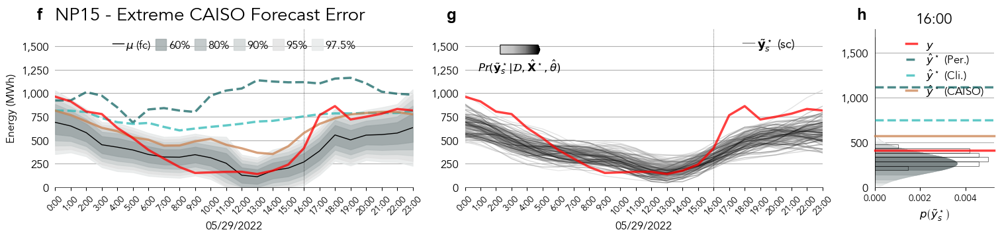

4 1


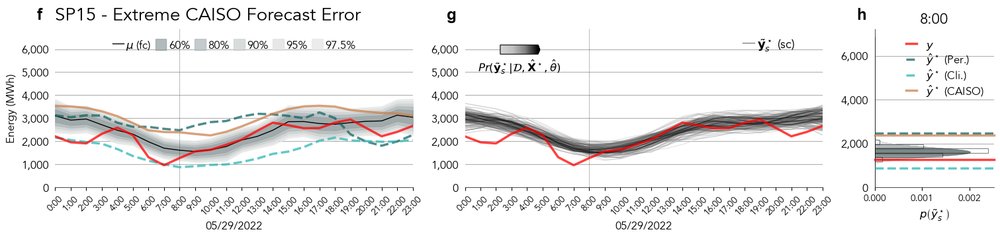

5 0


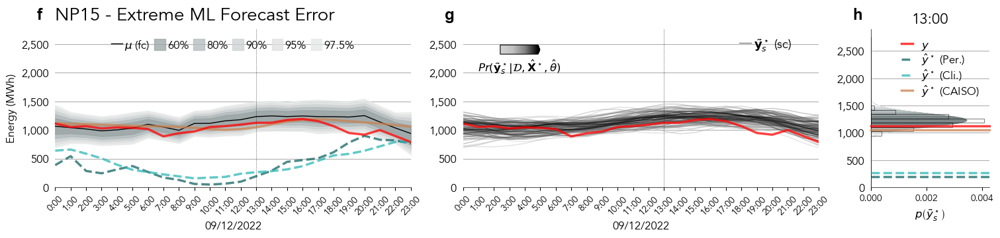

5 1


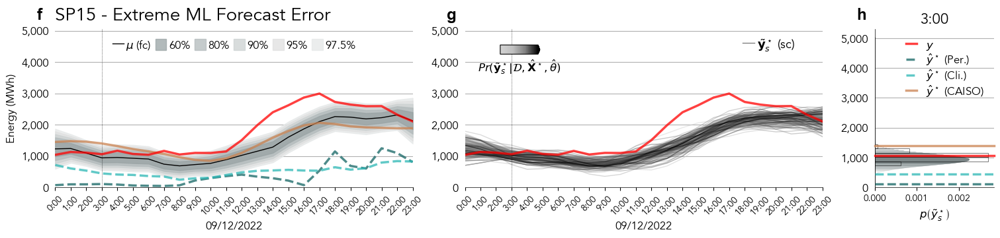

In [14]:
i_resource = 2

Y_       = _model_resource[i_resource]['targets']
Y_ml_    = _model_resource[i_resource]['mean']
S2_ml_   = np.sqrt(_model_resource[i_resource]['variance'])
Y_scens_ = _model_resource[i_resource]['samples']
print(Y_.shape, Y_ml_.shape, S2_ml_.shape, Y_scens_.shape)
Y_per_   = _baseline[i_resource]['persitence']
Y_clm_   = _baseline[i_resource]['climatology']
Y_caiso_ = _baseline[i_resource]['caiso']
print(Y_per_.shape, Y_clm_.shape, Y_caiso_.shape)

for i_sample, name, i_type in zip(samples_, labels_, range(len(samples_))):
    for i_zone in range(2):
        print(i_type, i_zone)

        y_       = Y_[i_sample, i_zone, :]
        mu_      = Y_ml_[i_sample, i_zone, :]
        s2_      = S2_ml_[i_sample, i_zone, :]
        y_per_   = Y_per_[i_sample, i_zone, :]
        y_clm_   = Y_clm_[i_sample, i_zone, :]
        y_iso_   = Y_caiso_[i_sample, i_zone, :]
        y_scens_ = Y_scens_[i_sample, i_zone, ...]  

        z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                         _model_resource[i_resource]['covariance'][i_sample, ...],
                         _model_resource[i_resource]['samples'][i_sample, ...])

        y_max  = np.max(mu_ + s2_)
        i_hour = np.argmax((y_iso_ - mu_)**2)

        fig, _ax = plt.subplot_mosaic([['f', 'g', 'h']], layout      = 'constrained', 
                                                         figsize     = (15, 3.5), 
                                                         gridspec_kw = {'width_ratios': [3, 3, 1]})
        
        cax = fig.add_axes([0.5, 0.78, 0.04, 0.04])

        for label, ax in _ax.items():
            ax.text(0.0, 1.0, label, transform = (ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
                                     fontsize  = 'xx-large', 
                                     weight    = "bold",
                                     va        = 'bottom', 
                                     family    = 'Arial')
            
        _plot_ci(_ax['f'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
                 i_hour     = i_hour,
                 y_min      = -1.,
                 y_max      = y_max*2,
                 label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
                 legend     = True, 
                 linestyle  = '-')

        _plot_scen(_ax['g'], cax, y_scens_, y_, mu_, z_,
                   i_hour       = i_hour,
                   y_min        = -1.,
                   label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
                   y_max        = y_max*2,
                   legend       = True, 
                   linestyle    = '-')

        _plot_detail(_ax['h'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
                     i_hour     = i_hour,
                     label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
                     nbins      = 35,
                     legend     = True, 
                     y_max      = y_max*2)

        _ax['f'].set_title(f'{zones_[i_zone]} - {name}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

        plt.savefig(path_to_images + 'is_demo_{}_{}-{}-{}.pdf'.format(i_type, resources_[i_resource], zones_[i_zone], i_sample), 
                    bbox_inches = 'tight', 
                    dpi         = 300)

        plt.show()

(243, 2, 24) (243, 2, 24) (243, 2, 24) (243, 2, 24, 100)
(243, 2, 24) (243, 2, 24) (243, 2, 24)


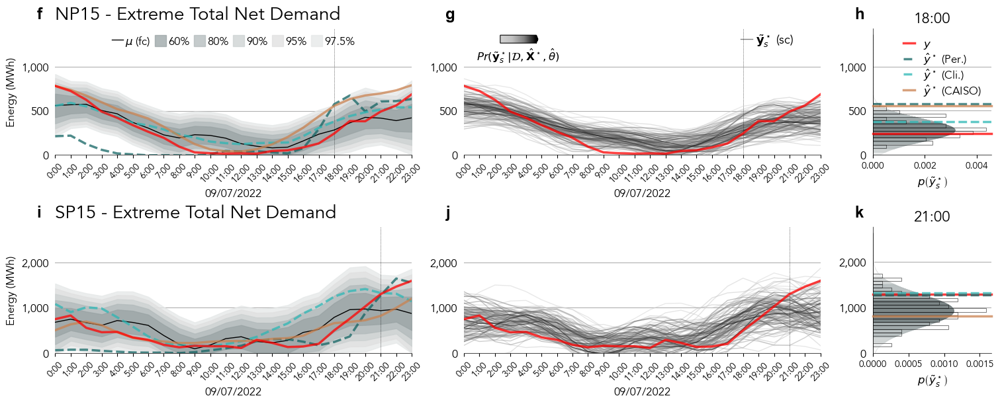

In [15]:
fig, _ax = plt.subplot_mosaic([['f', 'g', 'h'], 
                               ['i', 'j', 'k']], layout      = 'constrained', 
                                                 figsize     = (15, 6), 
                                                 gridspec_kw = {'width_ratios': [3, 3, 1]})

cax = fig.add_axes([0.5, 0.9, 0.04, 0.02])

for label, ax in _ax.items():
    ax.text(0.0, 1.0, label, transform = (ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
                             fontsize  = 'xx-large', 
                             weight    = "bold",
                             va        = 'bottom', 
                             family    = 'Arial')


i_resource = 2

Y_       = _model_resource[i_resource]['targets']
Y_ml_    = _model_resource[i_resource]['mean']
S2_ml_   = np.sqrt(_model_resource[i_resource]['variance'])
Y_scens_ = _model_resource[i_resource]['samples']
print(Y_.shape, Y_ml_.shape, S2_ml_.shape, Y_scens_.shape)
Y_per_   = _baseline[i_resource]['persitence']
Y_clm_   = _baseline[i_resource]['climatology']
Y_caiso_ = _baseline[i_resource]['caiso']
print(Y_per_.shape, Y_clm_.shape, Y_caiso_.shape)


i_type = 3
i_zone = 0
i_hour = 18

i_sample = samples_[i_type]
name     = labels_[i_type]

y_       = Y_[i_sample, i_zone, :]
mu_      = Y_ml_[i_sample, i_zone, :]
s2_      = S2_ml_[i_sample, i_zone, :]
y_per_   = Y_per_[i_sample, i_zone, :]
y_clm_   = Y_clm_[i_sample, i_zone, :]
y_iso_   = Y_caiso_[i_sample, i_zone, :]
y_scens_ = Y_scens_[i_sample, i_zone, ...]  

z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                 _model_resource[i_resource]['covariance'][i_sample, ...],
                 _model_resource[i_resource]['samples'][i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['f'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour     = i_hour,
         y_min      = -1.,
         y_max      = y_max*2,
         label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
         legend     = True, 
         linestyle  = '-')

_plot_scen(_ax['g'], cax, y_scens_, y_, mu_, z_,
           i_hour       = i_hour,
           y_min        = -1.,
           label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
           y_max        = y_max*2,
           legend       = True, 
           linestyle    = '-')

_plot_detail(_ax['h'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_hour     = i_hour,
             label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
             nbins      = 35,
             legend     = True, 
             y_max      = y_max*1.9)

_ax['f'].set_title(f'{zones_[i_zone]} - {name}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

i_type = 3
i_zone = 1
i_hour = 21

i_sample = samples_[i_type]
name     = labels_[i_type]

y_       = Y_[i_sample, i_zone, :]
mu_      = Y_ml_[i_sample, i_zone, :]
s2_      = S2_ml_[i_sample, i_zone, :]
y_per_   = Y_per_[i_sample, i_zone, :]
y_clm_   = Y_clm_[i_sample, i_zone, :]
y_iso_   = Y_caiso_[i_sample, i_zone, :]
y_scens_ = Y_scens_[i_sample, i_zone, ...]  

z_ = _eval_proba(_model_resource[i_resource]['mean'][i_sample, ...], 
                 _model_resource[i_resource]['covariance'][i_sample, ...],
                 _model_resource[i_resource]['samples'][i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['i'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour     = i_hour,
         y_min      = -1.,
         y_max      = y_max*2,
         label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
         legend     = False, 
         linestyle  = '-')

_plot_scen(_ax['j'], cax, y_scens_, y_, mu_, z_,
           i_hour       = i_hour,
           y_min        = -1.,
           label        = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
           y_max        = y_max*2,
           legend       = False, 
           linestyle    = '-')

_plot_detail(_ax['k'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_hour     = i_hour,
             label      = r'{}'.format(meta_resource_[i_resource].loc[i_sample, 'date']),
             nbins      = 35,
             legend     = False, 
             y_max      = y_max*1.9)

_ax['i'].set_title(f'{zones_[i_zone]} - {name}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

plt.savefig(path_to_images + 'is_demo_{}-{}.pdf'.format(resources_[i_resource], zones_[i_zone]), bbox_inches = 'tight', 
                                                                                                 dpi         = 300)


plt.show()

# Load Multi-Resource Models

In [16]:
path_to_mdls = r'/Users/Guille/Desktop/caiso_power/models/journal_paper_w_sigma_n_lambda-Cal-4/'

NP15_model_name = 'NP15-lasso-MTGPR-ES.pkl'
SP15_model_name = 'SP15-lasso-MTGPR-ES.pkl'
ZP26_model_name = 'ZP26-OMP-MTGPR-ES.pkl'

_model_1, meta_1_ = _load_model_data(NP15_model_name, path_to_mdls)
_model_2, meta_2_ = _load_model_data(SP15_model_name, path_to_mdls)
_model_3, meta_3_ = _load_model_data(ZP26_model_name, path_to_mdls)

_baseline   = [_l_baselines, _s_baselines, _w_baselines]
_model_zone = [_model_1, _model_2, _model_3]
meta_zone_  = [meta_1_, meta_2_, meta_3_]

## Multi-Energy Forecast

In [17]:
i_zone = 0

Y_       = _model_zone[i_zone]['targets'][:, 0, :] - _model_zone[i_zone]['targets'][:, 1, :] - _model_zone[i_zone]['targets'][:, 2, :] 
Y_ml_    = _model_zone[i_zone]['mean'][:, 0, :] - _model_zone[i_zone]['mean'][:, 1, :] - _model_zone[i_zone]['mean'][:, 2, :]
Y_caiso_ = _model_zone[i_zone]['caiso'][:, 0, :] - _model_zone[i_zone]['caiso'][:, 1, :] - _model_zone[i_zone]['caiso'][:, 2, :]
print(Y_.shape, Y_ml_.shape, Y_caiso_.shape)

i_zone = 1

Y_       = Y_ + _model_zone[i_zone]['targets'][:, 0, :] - _model_zone[i_zone]['targets'][:, 1, :] - _model_zone[i_zone]['targets'][:, 2, :] 
Y_ml_    = Y_ml_ + _model_zone[i_zone]['mean'][:, 0, :] - _model_zone[i_zone]['mean'][:, 1, :] - _model_zone[i_zone]['mean'][:, 2, :]
Y_caiso_ = Y_caiso_ + _model_zone[i_zone]['caiso'][:, 0, :] - _model_zone[i_zone]['caiso'][:, 1, :] - _model_zone[i_zone]['caiso'][:, 2, :]
print(Y_.shape, Y_ml_.shape, Y_caiso_.shape)

i_zone = 2

Y_       = Y_ + _model_zone[i_zone]['targets'][:, 0, :] - _model_zone[i_zone]['targets'][:, 1, :] 
Y_ml_    = Y_ml_ + _model_zone[i_zone]['mean'][:, 0, :] - _model_zone[i_zone]['mean'][:, 1, :]
Y_caiso_ = Y_caiso_ + _model_zone[i_zone]['caiso'][:, 0, :] - _model_zone[i_zone]['caiso'][:, 1, :] 
print(Y_.shape, Y_ml_.shape, Y_caiso_.shape)

(243, 24) (243, 24) (243, 24)
(243, 24) (243, 24) (243, 24)
(243, 24) (243, 24) (243, 24)


In [34]:
i_max     = np.argsort(np.max(Y_, axis = 1))[::-1][0]
i_min     = np.argsort(np.min(Y_, axis = 1))[0]
i_rr      = np.argsort(np.max(np.diff(Y_, axis = 1)))[::-1][0]
i_demand  = np.argsort(np.sum(Y_, axis = 1))[::-1][1]
i_regular = np.argsort(np.sum(Y_, axis = 1))[::-1][123]
i_caiso   = np.argsort(_RMSE(Y_, Y_caiso_))[::-1][0]
i_ml      = np.argsort(_RMSE(Y_, Y_ml_))[::-1][2]

samples_ = [i_max, i_min, i_rr, i_demand, i_caiso, i_ml]
labels_  = ['Extreme Peak Demand', 'Extreme Low Demand', 'Extreme Ramp-Up', 
            'Extreme Total Demand', 'Extreme Net Demand Forecast Error', 'Extreme ML Forecast Error']
print(samples_)

[array([ 9,  3,  8,  4,  2, 10,  5,  7,  1, 15,  6, 12, 11, 14, 13,  0, 16,
       23, 22, 17, 21, 20, 19, 18]), array([ 0, 21, 20, 22,  5, 23,  1,  2,  3,  4, 19,  6, 10, 11,  7,  9, 12,
        8, 18, 13, 14, 15, 16, 17]), 0, array([ 1,  0,  2,  4, 23,  3,  5,  6, 22, 21, 20, 19, 17, 18,  7, 16,  8,
       15,  9, 10, 14, 11, 13, 12]), 57, 204]


In [35]:
i_zone = 1

Y_       = _model_zone[i_zone]['targets']
Y_ml_    = _model_zone[i_zone]['mean']
S2_ml_   = np.sqrt(_model_zone[i_zone]['variance'])
C_ml_    = _model_zone[i_zone]['covariance']
Y_scens_ = _model_zone[i_zone]['samples']
Y_per_   = _model_zone[i_zone]['persitence']
Y_clm_   = _model_zone[i_zone]['climatology']
Y_caiso_ = _model_zone[i_zone]['caiso']

for i_sample, name, i_type in zip(samples_, labels_, range(len(samples_))):

    i_resource = 0

    y_       = Y_[i_sample, i_resource, :]
    mu_      = Y_ml_[i_sample, i_resource, :]
    s2_      = S2_ml_[i_sample, i_resource, :]
    y_scens_ = Y_scens_[i_sample, i_resource, ...]  
    y_per_   = Y_per_[i_sample, i_resource, :]
    y_clm_   = Y_clm_[i_sample, i_resource, :]
    y_iso_   = Y_caiso_[i_sample, i_resource, :]

    z_ = _eval_proba(Y_ml_[i_sample, ...], C_ml_[i_sample, ...], Y_scens_[i_sample, ...])

    y_max  = np.max(mu_ + s2_)
    i_hour = np.argmax((y_iso_ - mu_)**2)

    fig, _ax = plt.subplot_mosaic([['f', 'g', 'h'], ['i', 'j', 'k'], ['l', 'm', 'n']], layout      = 'constrained', 
                                                                                       figsize     = (15, 10), 
                                                                                       gridspec_kw = {'width_ratios': [3, 3, 1]})
    
    cax = fig.add_axes([0.5, 0.925, 0.04, 0.015])

    for label, ax in _ax.items():
        ax.text(0.0, 1.0, label, transform = (ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
                                 fontsize  = 'xx-large', 
                                 weight    = "bold",
                                 va        = 'bottom',
                                 family    = 'Arial')
            
    _plot_ci(_ax['f'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
             i_hour     = i_hour,
             y_min      = -1.,
             y_max      = y_max*1.5,
             label      = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
             legend     = True, 
             linestyle  = '-')

    _plot_scen(_ax['g'], cax, y_scens_, y_, mu_, z_,
               i_hour       = i_hour,
               y_min        = -1.,
               label        = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
               y_max        = y_max*1.5,
               legend       = True, 
               linestyle    = '-')

    _plot_detail(_ax['h'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
                 i_hour     = i_hour,
                 label      = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
                 nbins      = 35,
                 legend     = True, 
                 y_max      = y_max*1.5)

    i_resource = 1

    y_       = Y_[i_sample, i_resource, :]
    mu_      = Y_ml_[i_sample, i_resource, :]
    s2_      = S2_ml_[i_sample, i_resource, :]
    y_scens_ = Y_scens_[i_sample, i_resource, ...]  
    y_per_   = Y_per_[i_sample, i_resource, :]
    y_clm_   = Y_clm_[i_sample, i_resource, :]
    y_iso_   = Y_caiso_[i_sample, i_resource, :]

    z_ = _eval_proba(Y_ml_[i_sample, ...], C_ml_[i_sample, ...], Y_scens_[i_sample, ...])

    y_max  = np.max(mu_ + s2_)
    i_hour = np.argmax((y_iso_ - mu_)**2)
    
    _plot_ci(_ax['i'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
             i_hour    = i_hour,
             y_min     = -1.,
             y_max     = y_max*1.5,
             label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
             legend    = False, 
             linestyle = '-')

    _plot_scen(_ax['j'], cax, y_scens_, y_, mu_, z_,
               i_hour    = i_hour,
               y_min     = -1.,
               label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
               y_max     = y_max*1.5,
               legend    = False, 
               linestyle = '-')

    _plot_detail(_ax['k'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
                 i_hour = i_hour,
                 label  = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
                 nbins  = 35,
                 legend = False, 
                 y_max  = y_max*1.5)
    
    i_resource = 2

    y_       = Y_[i_sample, i_resource, :]
    mu_      = Y_ml_[i_sample, i_resource, :]
    s2_      = S2_ml_[i_sample, i_resource, :]
    y_scens_ = Y_scens_[i_sample, i_resource, ...]  
    y_per_   = Y_per_[i_sample, i_resource, :]
    y_clm_   = Y_clm_[i_sample, i_resource, :]
    y_iso_   = Y_caiso_[i_sample, i_resource, :]

    z_ = _eval_proba(Y_ml_[i_sample, ...], C_ml_[i_sample, ...], Y_scens_[i_sample, ...])

    y_max  = np.max(mu_ + s2_)
    i_hour = np.argmax((y_iso_ - mu_)**2)
    
    _plot_ci(_ax['l'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
             i_hour    = i_hour,
             y_min     = -1.,
             y_max     = y_max*2.5,
             label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
             legend    = False, 
             linestyle = '-')

    _plot_scen(_ax['m'], cax, y_scens_, y_, mu_, z_,
               i_hour    = i_hour,
               y_min     = -1.,
               label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
               y_max     = y_max*2.5,
               legend    = False, 
               linestyle = '-')

    _plot_detail(_ax['n'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
                 i_hour = i_hour,
                 label  = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
                 nbins  = 35,
                 legend = False, 
                 y_max  = y_max*2.5)
    
    _ax['f'].set_title(f'{zones_[i_zone]} - {name}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

    plt.savefig(path_to_images + 'ms_demo_{}_{}-{}-{}.pdf'.format(i_type, resources_[i_resource], zones_[i_zone], i_sample), 
                bbox_inches = 'tight', 
                dpi         = 300)

    plt.show()

ValueError: Array 'mean' must be a vector of length 576.

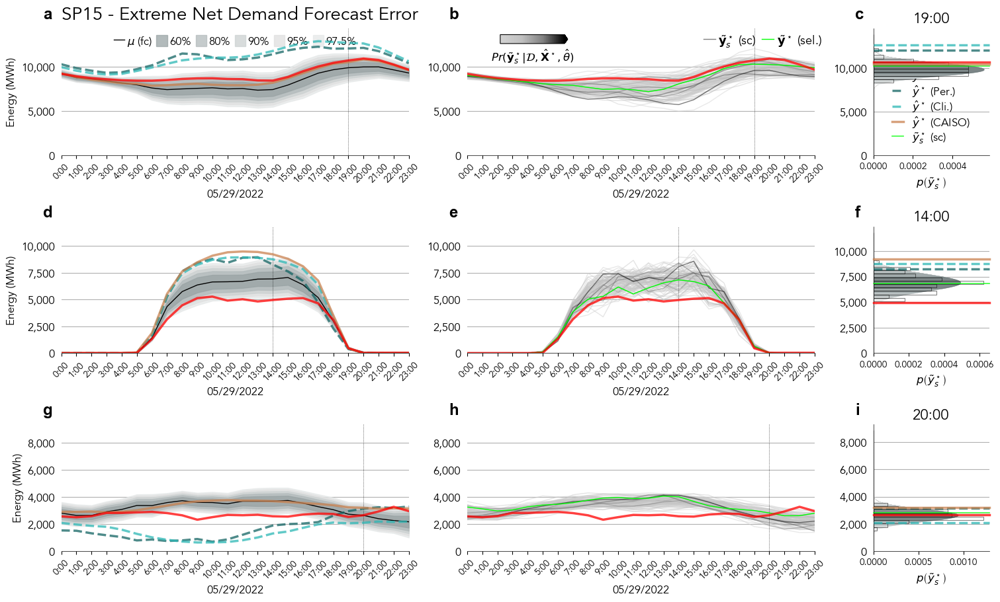

In [36]:
i_type = 4
i_zone = 1
i_scen = 20

i_sample = samples_[i_type]
name     = labels_[i_type]

Y_       = _model_zone[i_zone]['targets']
Y_ml_    = _model_zone[i_zone]['mean']
S2_ml_   = np.sqrt(_model_zone[i_zone]['variance'])
C_ml_    = _model_zone[i_zone]['covariance']
Y_scens_ = _model_zone[i_zone]['samples']
Y_per_   = _model_zone[i_zone]['persitence']
Y_clm_   = _model_zone[i_zone]['climatology']
Y_caiso_ = _model_zone[i_zone]['caiso']

fig, _ax = plt.subplot_mosaic([['a', 'b', 'c'], 
                               ['d', 'e', 'f'], 
                               ['g', 'h', 'i']], layout      = 'constrained', 
                                                 figsize     = (15, 9), 
                                                 gridspec_kw = {'width_ratios': [3, 3, 1]})

cax = fig.add_axes([0.5, 0.9325, 0.075, 0.015])

for label, ax in _ax.items():
    ax.text(0.0, 1.0, label, transform = (ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
                             fontsize  = 'xx-large', 
                             weight    = "bold",
                             va        = 'bottom',
                             family    = 'Arial')

i_resource = 0
i_hour     = 19

y_       = Y_[i_sample, i_resource, :]
mu_      = Y_ml_[i_sample, i_resource, :]
s2_      = S2_ml_[i_sample, i_resource, :]
y_scens_ = Y_scens_[i_sample, i_resource, ...]  
y_per_   = Y_per_[i_sample, i_resource, :]
y_clm_   = Y_clm_[i_sample, i_resource, :]
y_iso_   = Y_caiso_[i_sample, i_resource, :]

z_ = _eval_proba(Y_ml_[i_sample, ...], C_ml_[i_sample, ...], Y_scens_[i_sample, ...])

y_max  = np.max(mu_ + s2_)


_plot_ci(_ax['a'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour    = i_hour,
         y_min     = -1.,
         y_max     = y_max*1.35,
         label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
         legend    = True, 
         linestyle = '-')

_plot_scen(_ax['b'], cax, y_scens_, y_, mu_, z_,
           i_scen    = i_scen,
           i_hour    = i_hour,
           y_min     = -1.,
           label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
           y_max     = y_max*1.35,
           legend    = True, 
           linestyle = '-')

_plot_detail(_ax['c'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_scen = i_scen,
             i_hour = i_hour,
             label  = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
             nbins  = 35,
             legend = True, 
             y_max  = y_max*1.31)

i_resource = 1
i_hour     = 14

y_       = Y_[i_sample, i_resource, :]
mu_      = Y_ml_[i_sample, i_resource, :]
s2_      = S2_ml_[i_sample, i_resource, :]
y_scens_ = Y_scens_[i_sample, i_resource, ...]  
y_per_   = Y_per_[i_sample, i_resource, :]
y_clm_   = Y_clm_[i_sample, i_resource, :]
y_iso_   = Y_caiso_[i_sample, i_resource, :]

z_ = _eval_proba(Y_ml_[i_sample, ...], C_ml_[i_sample, ...], Y_scens_[i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['d'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour    = i_hour,
         y_min     = -1.,
         y_max     = y_max*1.5,
         label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
         legend    = False, 
         linestyle = '-')

_plot_scen(_ax['e'], cax, y_scens_, y_, mu_, z_,
           i_scen    = i_scen,
           i_hour    = i_hour,
           y_min     = -1.,
           label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
           y_max     = y_max*1.5,
           legend    = False, 
           linestyle = '-')

_plot_detail(_ax['f'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_scen = i_scen,
             i_hour = i_hour,
             label  = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
             nbins  = 35,
             legend = False, 
             y_max  = y_max*1.5)

i_resource = 2
i_hour     = 20

y_       = Y_[i_sample, i_resource, :]
mu_      = Y_ml_[i_sample, i_resource, :]
s2_      = S2_ml_[i_sample, i_resource, :]
y_scens_ = Y_scens_[i_sample, i_resource, ...]  
y_per_   = Y_per_[i_sample, i_resource, :]
y_clm_   = Y_clm_[i_sample, i_resource, :]
y_iso_   = Y_caiso_[i_sample, i_resource, :]

z_ = _eval_proba(Y_ml_[i_sample, ...], C_ml_[i_sample, ...], Y_scens_[i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['g'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour    = i_hour,
         y_min     = -1.,
         y_max     = y_max*2.25,
         label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
         legend    = False, 
         linestyle = '-')

_plot_scen(_ax['h'], cax, y_scens_, y_, mu_, z_,
           i_scen    = i_scen,
           i_hour    = i_hour,
           y_min     = -1.,
           label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
           y_max     = y_max*2.25,
           legend    = False, 
           linestyle = '-')

_plot_detail(_ax['i'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_scen = i_scen,
             i_hour = i_hour,
             label  = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
             nbins  = 35,
             legend = False, 
             y_max  = y_max*2.125)

_ax['a'].set_title(f'{zones_[i_zone]} - {name}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

plt.savefig(path_to_images + 'ms_demo_{}-{}-{}.pdf'.format(i_type, zones_[i_zone], i_sample), 
            bbox_inches = 'tight', 
            dpi         = 300)

plt.show()

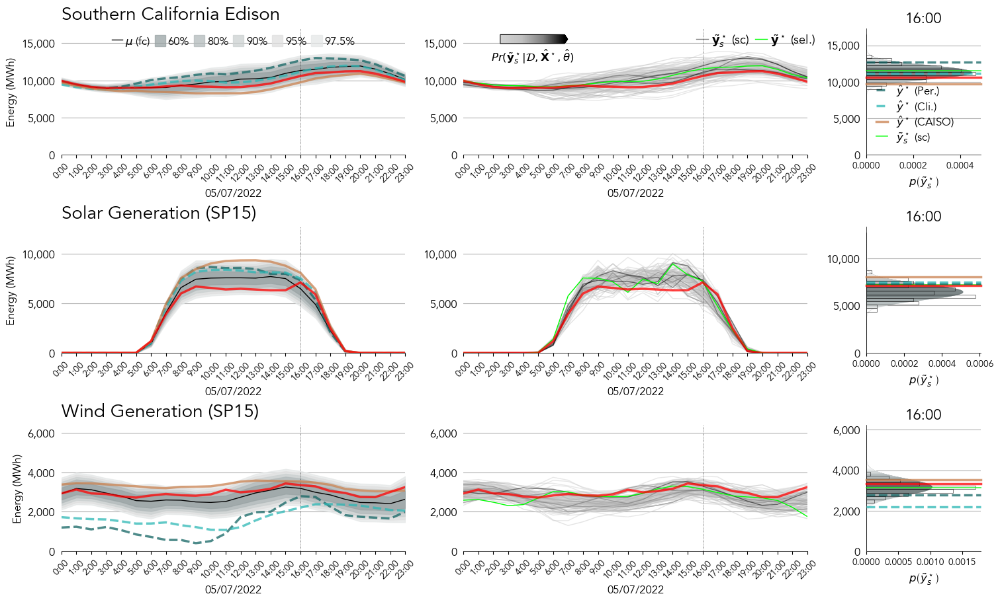

In [21]:
# i_type = 4
i_zone = 1
i_scen = 20

# i_sample = samples_[i_type]
# name     = labels_[i_type]

i_sample = np.argsort(_RMSE(Y_, Y_caiso_))[::-1][9]

Y_       = _model_zone[i_zone]['targets']
Y_ml_    = _model_zone[i_zone]['mean']
S2_ml_   = np.sqrt(_model_zone[i_zone]['variance'])
C_ml_    = _model_zone[i_zone]['covariance']
Y_scens_ = _model_zone[i_zone]['samples']
Y_per_   = _model_zone[i_zone]['persitence']
Y_clm_   = _model_zone[i_zone]['climatology']
Y_caiso_ = _model_zone[i_zone]['caiso']

fig, _ax = plt.subplot_mosaic([['f', 'g', 'h'], 
                               ['i', 'j', 'k'], 
                               ['l', 'm', 'n']], layout      = 'constrained', 
                                                 figsize     = (15, 9), 
                                                 gridspec_kw = {'width_ratios': [3, 3, 1]})

cax = fig.add_axes([0.5, 0.9325, 0.075, 0.015])

# for label, ax in _ax.items():
#     ax.text(0.0, 1.0, label, transform = (ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
#                              fontsize  = 'xx-large', 
#                              weight    = "bold",
#                              va        = 'bottom',
#                              family    = 'Arial')

i_resource = 0
i_hour     = 16

y_       = Y_[i_sample, i_resource, :]
mu_      = Y_ml_[i_sample, i_resource, :]
s2_      = S2_ml_[i_sample, i_resource, :]
y_scens_ = Y_scens_[i_sample, i_resource, ...]  
y_per_   = Y_per_[i_sample, i_resource, :]
y_clm_   = Y_clm_[i_sample, i_resource, :]
y_iso_   = Y_caiso_[i_sample, i_resource, :]

z_ = _eval_proba(Y_ml_[i_sample, ...], C_ml_[i_sample, ...], Y_scens_[i_sample, ...])

y_max  = np.max(mu_ + s2_)


_plot_ci(_ax['f'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour    = i_hour,
         y_min     = -1.,
         y_max     = y_max*1.35,
         label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
         legend    = True, 
         linestyle = '-')

_plot_scen(_ax['g'], cax, y_scens_, y_, mu_, z_,
           i_scen    = i_scen,
           i_hour    = i_hour,
           y_min     = -1.,
           label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
           y_max     = y_max*1.35,
           legend    = True, 
           linestyle = '-')

_plot_detail(_ax['h'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_scen = i_scen,
             i_hour = i_hour,
             label  = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
             nbins  = 35,
             legend = True, 
             y_max  = y_max*1.31)

i_resource = 1

y_       = Y_[i_sample, i_resource, :]
mu_      = Y_ml_[i_sample, i_resource, :]
s2_      = S2_ml_[i_sample, i_resource, :]
y_scens_ = Y_scens_[i_sample, i_resource, ...]  
y_per_   = Y_per_[i_sample, i_resource, :]
y_clm_   = Y_clm_[i_sample, i_resource, :]
y_iso_   = Y_caiso_[i_sample, i_resource, :]

z_ = _eval_proba(Y_ml_[i_sample, ...], C_ml_[i_sample, ...], Y_scens_[i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['i'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour    = i_hour,
         y_min     = -1.,
         y_max     = y_max*1.5,
         label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
         legend    = False, 
         linestyle = '-')

_plot_scen(_ax['j'], cax, y_scens_, y_, mu_, z_,
           i_scen    = i_scen,
           i_hour    = i_hour,
           y_min     = -1.,
           label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
           y_max     = y_max*1.5,
           legend    = False, 
           linestyle = '-')

_plot_detail(_ax['k'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_scen = i_scen,
             i_hour = i_hour,
             label  = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
             nbins  = 35,
             legend = False, 
             y_max  = y_max*1.5)

i_resource = 2

y_       = Y_[i_sample, i_resource, :]
mu_      = Y_ml_[i_sample, i_resource, :]
s2_      = S2_ml_[i_sample, i_resource, :]
y_scens_ = Y_scens_[i_sample, i_resource, ...]  
y_per_   = Y_per_[i_sample, i_resource, :]
y_clm_   = Y_clm_[i_sample, i_resource, :]
y_iso_   = Y_caiso_[i_sample, i_resource, :]

z_ = _eval_proba(Y_ml_[i_sample, ...], C_ml_[i_sample, ...], Y_scens_[i_sample, ...])

y_max  = np.max(mu_ + s2_)

_plot_ci(_ax['l'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
         i_hour    = i_hour,
         y_min     = -1.,
         y_max     = y_max*1.75,
         label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
         legend    = False, 
         linestyle = '-')

_plot_scen(_ax['m'], cax, y_scens_, y_, mu_, z_,
           i_scen    = i_scen,
           i_hour    = i_hour,
           y_min     = -1.,
           label     = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
           y_max     = y_max*1.75,
           legend    = False, 
           linestyle = '-')

_plot_detail(_ax['n'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
             i_scen = i_scen,
             i_hour = i_hour,
             label  = r'{}'.format(meta_zone_[i_zone].loc[i_sample + 1, 'date']),
             nbins  = 35,
             legend = False, 
             y_max  = y_max*1.625)

_ax['f'].set_title(r'Southern California Edison', fontsize = 20, y = 1.025, weight = "bold", loc = "left")
_ax['i'].set_title(r'Solar Generation (SP15)', fontsize = 20, y = 1.025, weight = "bold", loc = "left")
_ax['l'].set_title(r'Wind Generation (SP15)', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

plt.savefig(path_to_images + 'flayer-ms_demo.pdf', 
            bbox_inches = 'tight', 
            dpi         = 300)

plt.show()

# Net Demand Forecast

In [140]:
Y_       = np.sum(_model_resource[0]['targets'], axis = 1) - np.sum(_model_resource[1]['targets'], axis = 1) - np.sum(_model_resource[2]['targets'], axis = 1)
Y_ml_    = np.sum(_model_resource[0]['mean'], axis = 1) - np.sum(_model_resource[1]['mean'], axis = 1) - np.sum(_model_resource[2]['mean'], axis = 1)
Y_caiso_ = np.sum(_baseline[0]['caiso'], axis = 1) - np.sum(_baseline[1]['caiso'], axis = 1) - np.sum(_baseline[2]['caiso'], axis = 1)
print(Y_.shape, Y_ml_.shape, Y_caiso_.shape)

S2_ml_   = np.sqrt(np.sum(_model_resource[0]['variance'], axis = 1) + np.sum(_model_resource[1]['variance'], axis = 1) + np.sum(_model_resource[2]['variance'], axis = 1))
Y_scens_ = np.sum(_model_resource[0]['samples'], axis = 1) - np.sum(_model_resource[1]['samples'], axis = 1) - np.sum(_model_resource[2]['samples'], axis = 1)
print(S2_ml_.shape, Y_scens_.shape)


(243, 24) (243, 24) (243, 24)
(243, 24) (243, 24, 100)


In [141]:
Y_       = _model_zone[0]['targets'][:, 0, :] - _model_zone[0]['targets'][:, 1, :] - _model_zone[0]['targets'][:, 2, :] 
Y_ml_    = _model_zone[0]['mean'][:, 0, :] - _model_zone[0]['mean'][:, 1, :] - _model_zone[0]['mean'][:, 2, :]
S2_ml_   = np.sqrt(_model_zone[0]['variance'][:, 0, :] + _model_zone[0]['variance'][:, 1, :] + _model_zone[0]['variance'][:, 2, :])
Y_scens_ = _model_zone[0]['samples'][:, 0, ...] - _model_zone[0]['samples'][:, 1, ...] - _model_zone[0]['samples'][:, 2, ...]
Y_caiso_ = _model_zone[0]['caiso'][:, 0, :] - _model_zone[0]['caiso'][:, 1, :] - _model_zone[0]['caiso'][:, 2, :]
Y_       = Y_ + _model_zone[1]['targets'][:, 0, :] - _model_zone[1]['targets'][:, 1, :] - _model_zone[1]['targets'][:, 2, :] 
Y_ml_    = Y_ml_ + _model_zone[1]['mean'][:, 0, :] - _model_zone[1]['mean'][:, 1, :] - _model_zone[1]['mean'][:, 2, :]
S2_ml_   = S2_ml_ + np.sqrt(_model_zone[1]['variance'][:, 0, :] + _model_zone[1]['variance'][:, 1, :] + _model_zone[1]['variance'][:, 2, :])
Y_scens_ = Y_scens_ + _model_zone[1]['samples'][:, 0, ...] - _model_zone[1]['samples'][:, 1, ...] - _model_zone[1]['samples'][:, 2, ...]
Y_caiso_ = Y_caiso_ + _model_zone[1]['caiso'][:, 0, :] - _model_zone[1]['caiso'][:, 1, :] - _model_zone[1]['caiso'][:, 2, :]
Y_       = Y_ + _model_zone[2]['targets'][:, 0, :] - _model_zone[2]['targets'][:, 1, :] 
Y_ml_    = Y_ml_ + _model_zone[2]['mean'][:, 0, :] - _model_zone[2]['mean'][:, 1, :]
S2_ml_   = S2_ml_ + np.sqrt(_model_zone[2]['variance'][:, 0, :] + _model_zone[2]['variance'][:, 1, :])
Y_scens_ = Y_scens_ + _model_zone[2]['samples'][:, 0, ...] - _model_zone[2]['samples'][:, 1, ...]
Y_caiso_ = Y_caiso_ + _model_zone[2]['caiso'][:, 0, :] - _model_zone[2]['caiso'][:, 1, :] 
print(Y_.shape, Y_ml_.shape, S2_ml_.shape, Y_caiso_.shape)

(243, 24) (243, 24) (243, 24) (243, 24)


In [142]:
i_max     = np.argsort(np.max(Y_, axis = 1))[::-1][1]
i_min     = np.argsort(np.min(Y_, axis = 1))[0]
i_rr      = np.argsort(np.max(np.diff(Y_, axis = 1)**2, axis = 1))[::-1][0]
i_demand  = np.argsort(np.sum(Y_, axis = 1))[::-1][0]
i_regular = np.argsort(np.sum(Y_, axis = 1))[::-1][123]
i_caiso   = np.argsort(_RMSE(Y_, Y_caiso_))[::-1][1]
i_ml      = np.argsort(_RMSE(Y_caiso_, Y_ml_))[::-1][1]

samples_ = [i_max, i_min, i_rr, i_demand, i_caiso, i_ml]
labels_  = ['Extreme Peak', 'Extreme Low Net Demand', 'Extreme Ramp-Up Net Demand', 
            'Extreme Total Net Demand', 'Extreme CAISO Forecast Error', 'Extreme ML Forecast Error']
print(samples_)

[155, 28, 226, 157, 58, 7]


(243, 24) (243, 24)


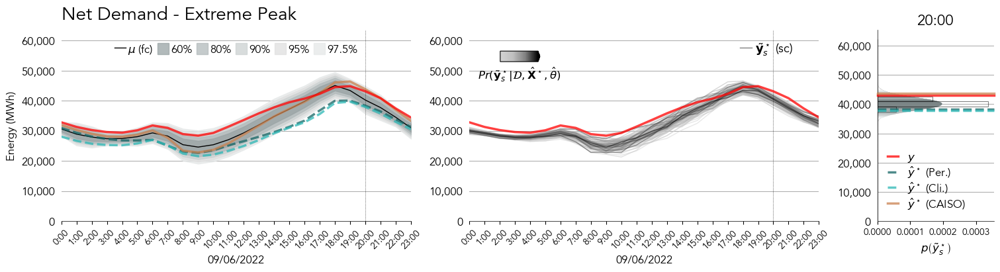

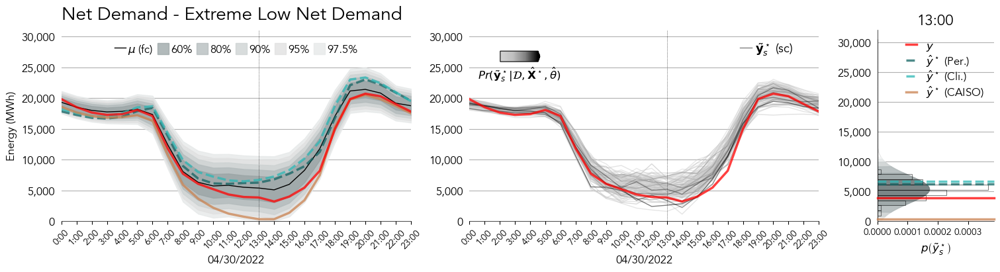

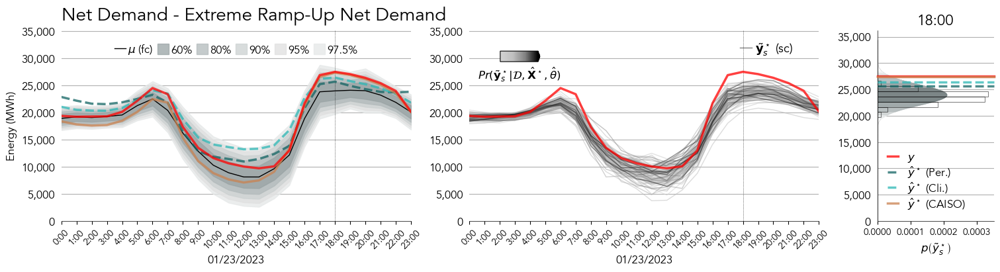

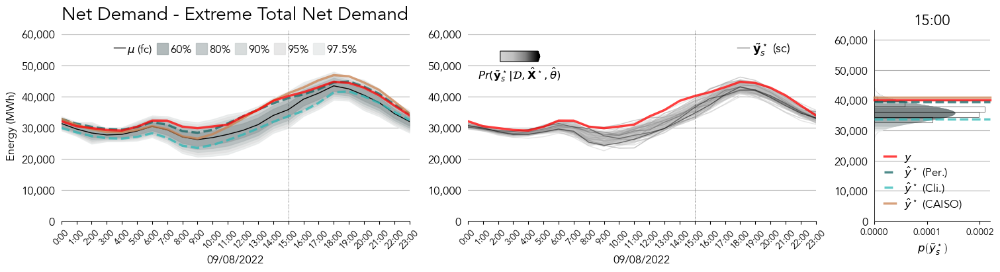

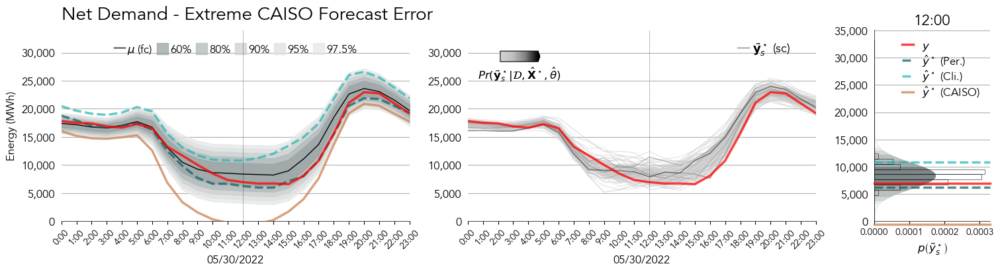

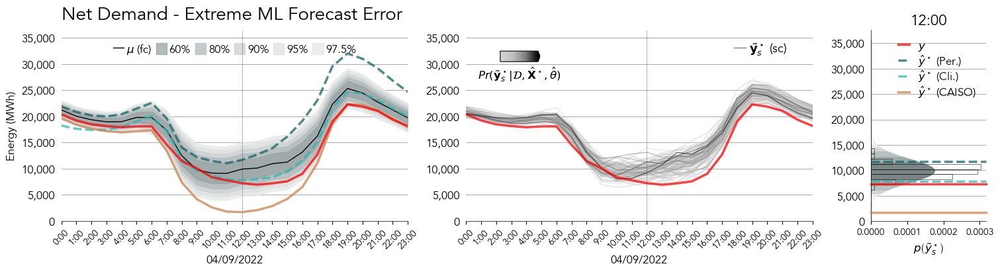

In [143]:
Y_per_ = np.sum(_baseline[0]['persitence'], axis = 1) - np.sum(_baseline[1]['persitence'], axis = 1) - np.sum(_baseline[2]['persitence'], axis = 1)
Y_clm_ = np.sum(_baseline[0]['climatology'], axis = 1) - np.sum(_baseline[1]['climatology'], axis = 1) - np.sum(_baseline[2]['climatology'], axis = 1)
print(Y_clm_.shape, Y_caiso_.shape)

for i_sample, name, i_type in zip(samples_, labels_, range(len(samples_))):

    y_       = Y_[i_sample, :]
    mu_      = Y_ml_[i_sample, :]
    s2_      = S2_ml_[i_sample, :]
    y_per_   = Y_per_[i_sample, :]
    y_clm_   = Y_clm_[i_sample, :]
    y_iso_   = Y_caiso_[i_sample, :]
    y_scens_ = Y_scens_[i_sample, ...]  

    z_l_ = _eval_proba(_model_resource[0]['mean'][i_sample, ...], _model_resource[0]['covariance'][i_sample, ...], _model_resource[0]['samples'][i_sample, ...])
    z_s_ = _eval_proba(_model_resource[1]['mean'][i_sample, ...], _model_resource[1]['covariance'][i_sample, ...], _model_resource[1]['samples'][i_sample, ...])
    z_w_ = _eval_proba(_model_resource[2]['mean'][i_sample, ...], _model_resource[2]['covariance'][i_sample, ...], _model_resource[2]['samples'][i_sample, ...])
    z_   = z_l_*z_s_*z_w_
    
    # z_1_ = _eval_proba(_model_zone[0]['mean'][i_sample, ...], _model_zone[0]['covariance'][i_sample, ...], _model_zone[0]['samples'][i_sample, ...])
    # z_2_ = _eval_proba(_model_zone[1]['mean'][i_sample, ...], _model_zone[1]['covariance'][i_sample, ...], _model_zone[1]['samples'][i_sample, ...])
    # z_3_ = _eval_proba(_model_zone[2]['mean'][i_sample, ...], _model_zone[2]['covariance'][i_sample, ...], _model_zone[2]['samples'][i_sample, ...])
    # z_   = z_1_*z_2_*z_3_
    
    y_max  = np.max(mu_ + s2_)
    i_hour = np.argmax((y_iso_ - mu_)**2)

    fig, _ax = plt.subplot_mosaic([['a', 'b', 'c']], layout      = 'constrained', 
                                                     figsize     = (15., 4), 
                                                     gridspec_kw = {'width_ratios': [3, 3, 1]})

    cax = fig.add_axes([0.5, 0.78, 0.04, 0.04])

    _plot_ci(_ax['a'], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
             i_hour     = i_hour,
             y_min      = -1.,
             y_max      = y_max*1.35,
             label      = r'{}'.format(meta_resource_[0].loc[i_sample + 1, 'date']),
             legend     = True, 
             linestyle  = '-')

    _plot_scen(_ax['b'], cax, y_scens_, y_, mu_, z_,
               i_hour       = i_hour,
               y_min        = -1.,
               label        = r'{}'.format(meta_resource_[0].loc[i_sample + 1, 'date']),
               y_max        = y_max*1.35,
               legend       = True, 
               linestyle    = '-')
    
    _plot_detail(_ax['c'], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
                 i_hour     = i_hour,
                 label      = r'{}'.format(meta_resource_[0].loc[i_sample + 1, 'date']),
                 nbins      = 35,
                 legend     = True, 
                 y_max      = y_max*1.325)

    _ax['a'].set_title(f'Net Demand - {name}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

    plt.savefig(path_to_images + 'net_load_{}-{}.pdf'.format(i_type, i_sample), bbox_inches = 'tight', 
                                                                                dpi         = 300)

    plt.show()

(243, 24) (243, 24)


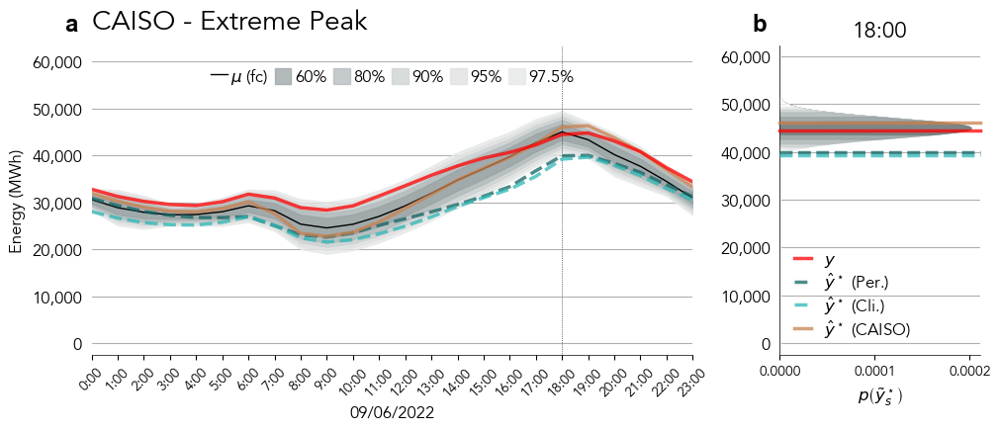

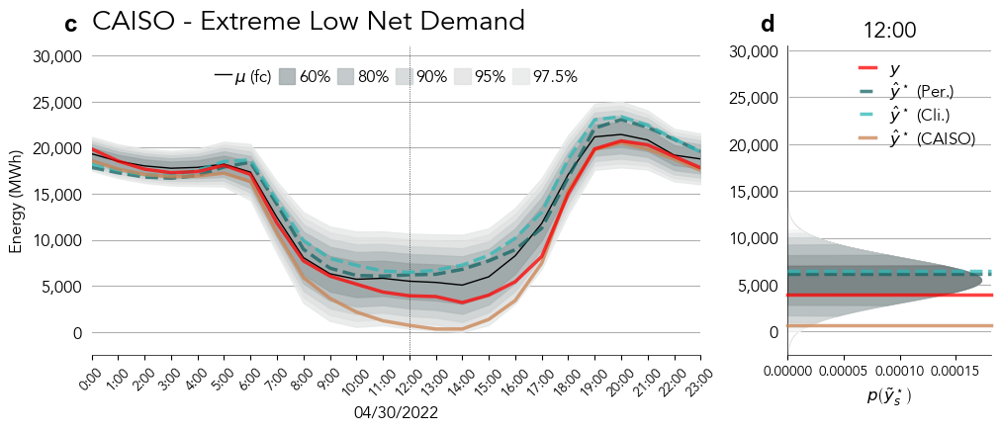

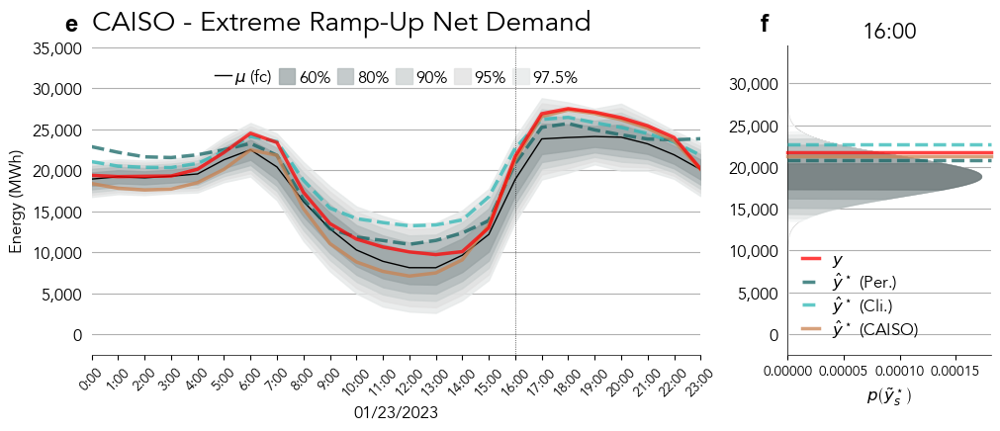

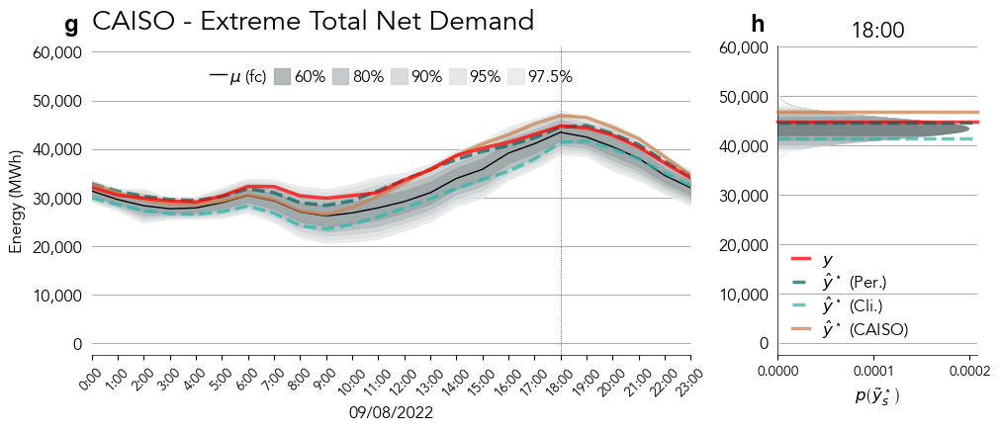

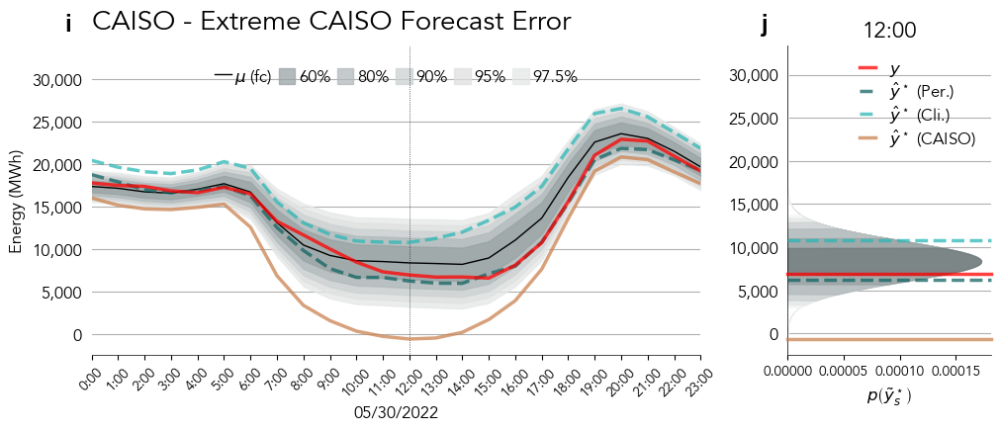

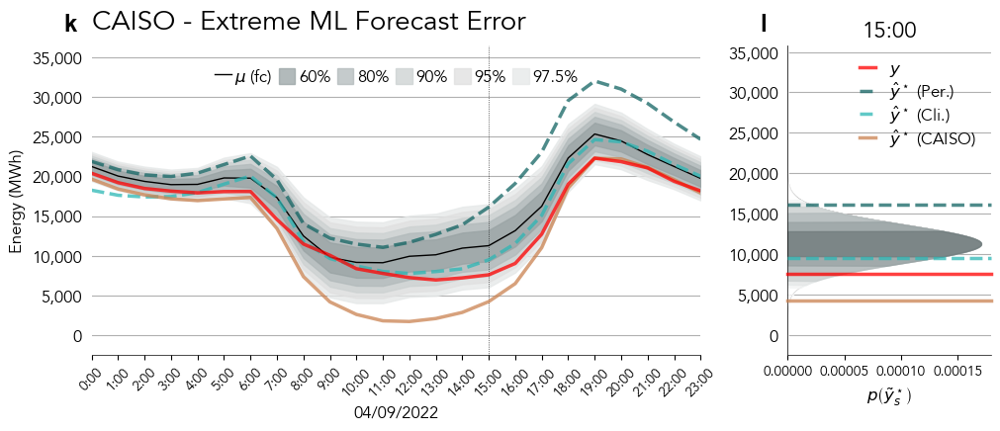

In [144]:
Y_per_ = np.sum(_baseline[0]['persitence'], axis = 1) - np.sum(_baseline[1]['persitence'], axis = 1) - np.sum(_baseline[2]['persitence'], axis = 1)
Y_clm_ = np.sum(_baseline[0]['climatology'], axis = 1) - np.sum(_baseline[1]['climatology'], axis = 1) - np.sum(_baseline[2]['climatology'], axis = 1)
print(Y_clm_.shape, Y_caiso_.shape)

key_lists_ = [['a', 'b'], ['c', 'd'], ['e', 'f'], ['g', 'h'], ['i', 'j'], ['k', 'l'], ['m', 'n']]
hours_     = [18, 12, 16, 18, 12, 15, 10]

for i_sample, name, i_type in zip(samples_, labels_, range(len(samples_))):
    keys_ = key_lists_[i_type]

    y_       = Y_[i_sample, :]
    mu_      = Y_ml_[i_sample, :]
    s2_      = S2_ml_[i_sample, :]
    y_per_   = Y_per_[i_sample, :]
    y_clm_   = Y_clm_[i_sample, :]
    y_iso_   = Y_caiso_[i_sample, :]
    y_scens_ = Y_scens_[i_sample, ...]  

    z_l_ = _eval_proba(_model_resource[0]['mean'][i_sample, ...], _model_resource[0]['covariance'][i_sample, ...], _model_resource[0]['samples'][i_sample, ...])
    z_s_ = _eval_proba(_model_resource[1]['mean'][i_sample, ...], _model_resource[1]['covariance'][i_sample, ...], _model_resource[1]['samples'][i_sample, ...])
    z_w_ = _eval_proba(_model_resource[2]['mean'][i_sample, ...], _model_resource[2]['covariance'][i_sample, ...], _model_resource[2]['samples'][i_sample, ...])
    z_   = z_l_*z_s_*z_w_
    
    # z_1_ = _eval_proba(_model_zone[0]['mean'][i_sample, ...], _model_zone[0]['covariance'][i_sample, ...], _model_zone[0]['samples'][i_sample, ...])
    # z_2_ = _eval_proba(_model_zone[1]['mean'][i_sample, ...], _model_zone[1]['covariance'][i_sample, ...], _model_zone[1]['samples'][i_sample, ...])
    # z_3_ = _eval_proba(_model_zone[2]['mean'][i_sample, ...], _model_zone[2]['covariance'][i_sample, ...], _model_zone[2]['samples'][i_sample, ...])
    # z_   = z_1_*z_2_*z_3_
    
    y_max  = np.max(mu_ + s2_)
    i_hour = np.argmax((y_iso_ - mu_)**2)

    fig, _ax = plt.subplot_mosaic([keys_], layout      = 'constrained', 
                                           figsize     = (10, 4.25), 
                                           gridspec_kw = {'width_ratios': [3, 1]})

    for label, ax in _ax.items():
        ax.text(0.0, 1.0, label, transform = (ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
                                 fontsize  = 'xx-large', 
                                 weight    = "bold",
                                 va        = 'bottom',
                                 family    = 'Arial')
        
    _plot_ci(_ax[keys_[0]], y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_,
             i_hour     = hours_[i_type],
             y_min      = -2500.,
             y_max      = y_max*1.35,
             label      = r'{}'.format(meta_resource_[0].loc[i_sample + 1, 'date']),
             legend     = True, 
             linestyle  = '-')
    
    _plot_density(_ax[keys_[1]], y_scens_, y_, mu_, s2_, y_per_, y_clm_, y_iso_, colors_2_, 
                 i_hour     = hours_[i_type],
                 label      = r'{}'.format(meta_resource_[0].loc[i_sample + 1, 'date']),
                 nbins      = 50,
                 legend     = True, 
                 y_min      = -2500.,
                 y_max      = y_max*1.325)

    _ax[keys_[0]].set_title(f'CAISO - {name}', fontsize = 20, y = 1.025, weight = "bold", loc = "left")

    plt.savefig(path_to_images + 'net_load_{}-{}.pdf'.format(i_type, i_sample), bbox_inches = 'tight', 
                                                                                dpi         = 300)

    plt.show()